# Macro-enhanced trend following for bond markets

## Get packages and JPMaQS data

In [2]:
# >>> Define constants <<< #
import os

# Minimum Macrosynergy package version required for this notebook
MIN_REQUIRED_VERSION: str = "0.1.32"

# DataQuery credentials: Remember to replace with your own client ID and secret
DQ_CLIENT_ID: str = os.getenv("DQ_CLIENT_ID")
DQ_CLIENT_SECRET: str = os.getenv("DQ_CLIENT_SECRET")

# Define any Proxy settings required (http/https)
PROXY = {}

# Start date for the data (argument passed to the JPMaQSDownloader class)
START_DATE: str = "1992-01-01"

In [3]:
# ! pip install macrosynergy --upgrade

In [4]:
# Standard library imports
from typing import List, Tuple, Dict
import warnings
import os
import itertools

import numpy as np
import pandas as pd
from pandas import Timestamp
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from scipy.stats import chi2

# Macrosynergy package imports
import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.pnl as msn
import macrosynergy.visuals as msv
import macrosynergy.signal as mss
from macrosynergy.management.utils import merge_categories
from macrosynergy.visuals import ScoreVisualisers

from macrosynergy.download import JPMaQSDownload

warnings.simplefilter("ignore")

In [5]:
# Cross sections
cids_gb = ["USD"]

# Countries used for panel calculations
cids_add = ["EUR", "JPY", "GBP", "USD", "AUD", "CAD", "CHF", "NOK", "NZD", "SEK"]  # additional countries for scoring
cids_ecos = cids_gb + cids_add  # all areas used for economic analysis
cids = cids_ecos + ["DEM"]  # add Germany as representative issuer in euro area

In [6]:
# Category tickers

infl = [
    "CPIH_SA_P1M1ML12",
    "CPIHE_SA_P1M1ML12",
    "CPIC_SA_P1M1ML12",
    "CPICE_SA_P1M1ML12",
    "CPIC_SJA_P3M3ML3AR",
    "CPICE_SJA_P3M3ML3AR", 
    "CPIC_SJA_P6M6ML6AR",
    "CPICE_SJA_P6M6ML6AR", 
    "INFE1Y_JA",
    "INFTEFF_NSA",
    "INFTARGET_NSA",
    "WAGES_NSA_P1Q1QL4",
    "WAGES_NSA_P1M1ML12_3MMA",
]

moncred = [
    "MNARROW_SJA_P1M1ML12",
    "MBROAD_SJA_P1M1ML12",
    "PCREDITBN_SJA_P1M1ML12",
    "PCREDITGDP_SJA_D1M1ML12"
]
growth = [
    "INTRGDPv5Y_NSA_P1M1ML12_3MMA",
    "RGDPTECHv5Y_SA_P1M1ML12_3MMA",
    "RGDP_SA_P1Q1QL4_20QMM",
    "IMPORTS_SA_P1M1ML12_3MMA",
]
labour = [
    "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_NSA_D1Q1QL4",
    "EMPL_NSA_P1M1ML12_3MMA",
    "EMPL_NSA_P1Q1QL4",
    "UNEMPLRATE_SA_3MMAv5YMA",
    "WFORCE_NSA_P1Y1YL1_5YMM",
]
confidence = [
    "RPCONS_SA_P1Q1QL4",
    "RPCONS_SA_P1M1ML12_3MMA",
    "MBCSCORE_SA",
    "SBCSCORE_SA",
    "CBCSCORE_SA",
    "CCSCORE_SA", 
    "MBCSCORE_SA_3MMA",
    "SBCSCORE_SA_3MMA",
    "CCSCORE_SA_3MMA",
    "CBCSCORE_SA_3MMA",
    "CCSCORE_SA_D1Q1QL1",
    "CCSCORE_SA_D3M3ML3",
    "SBCSCORE_SA_D1Q1QL1", 
    "SBCSCORE_SA_D3M3ML3",
    "CBCSCORE_SA_D1Q1QL1",
    "CBCSCORE_SA_D3M3ML3",
    "MBCSCORE_SA_D1Q1QL1",
    "MBCSCORE_SA_D3M3ML3",
    "NRSALES_SA_P1M1ML12",
    "NRSALES_SA_P1M1ML12_3MMA",
]
hpinf = [
    "HPI_SA_P1M1ML12_3MMA", 
    "RHPI_SA_P1M1ML12_3MMA",
    "HPI_SA_P1Q1QL4",
    "RHPI_SA_P1Q1QL4",
    ]

main = infl + confidence + moncred + growth + labour + hpinf

rets = [
    "GB05YXR_NSA",
    "GB10YXR_NSA",
    "GB02YXR_VT10",
    "GB10YXR_VT10",
]

xcats = main + rets

In [7]:
tickers = [cid + "_" + xcat for cid in cids for xcat in xcats]
print(f"Maximum number of tickers is {len(tickers)}") 

# Download series from J.P. Morgan DataQuery by tickers

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

with JPMaQSDownload(client_id=client_id, client_secret=client_secret) as dq:
    df = dq.download(
        tickers=tickers,
        start_date="1992-01-01",
        suppress_warning=True,
        metrics=[
            "value",
        ],
        show_progress=True,
    )

Maximum number of tickers is 660
Timestamp UTC:  2024-12-06 14:00:05
Connection successful!


Requesting data: 100%|██████████| 31/31 [00:07<00:00,  4.02it/s]


Some expressions are missing from the downloaded data. Check logger output for complete list.
206 out of 605 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
2 out of 8595 dates are missing.


In [8]:
scols = ["cid", "xcat", "real_date", "value"]  # required columns
dfx = df[scols].copy()
dfx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2918774 entries, 0 to 2918773
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   cid        object        
 1   xcat       object        
 2   real_date  datetime64[ns]
 3   value      float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 89.1+ MB


## Availability and renamings

### Downloaded category groups

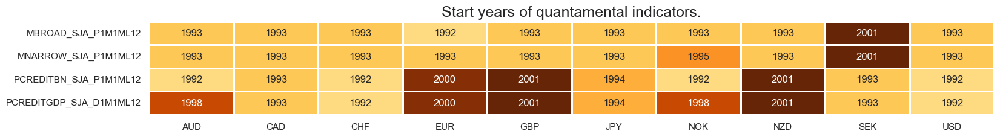

In [9]:
xcatx = moncred
msm.check_availability(df, xcats=xcatx, cids=cids, missing_recent=False)

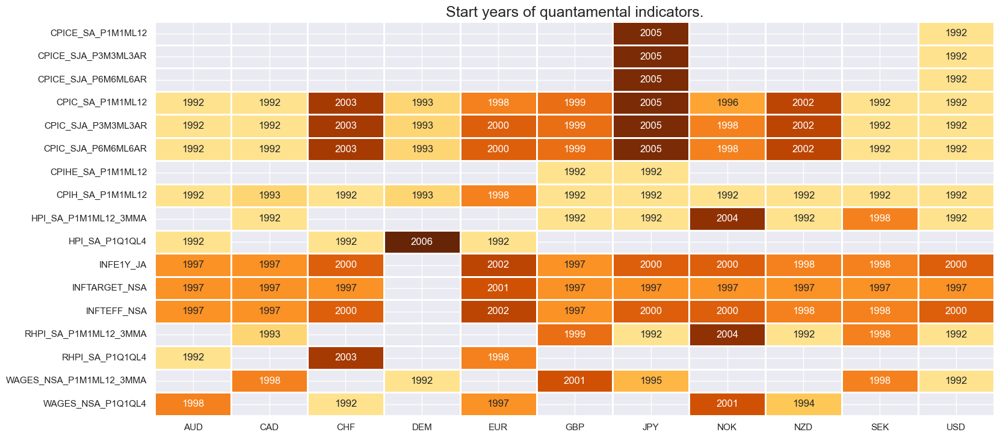

In [10]:
xcatx = infl + hpinf
msm.check_availability(df, xcats=xcatx, cids=cids, missing_recent=False)

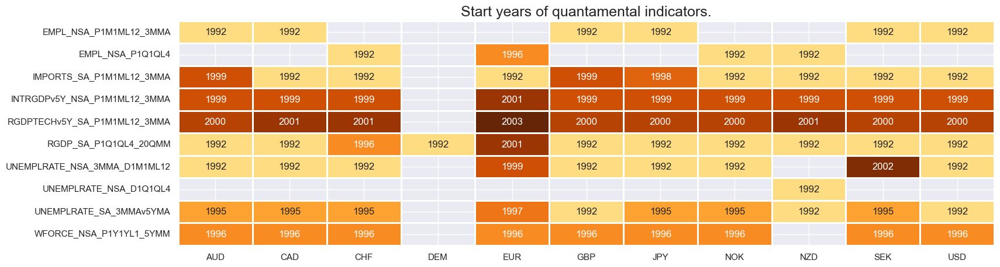

In [11]:
xcatx = growth + labour
msm.check_availability(df, xcats=xcatx, cids=cids, missing_recent=False)

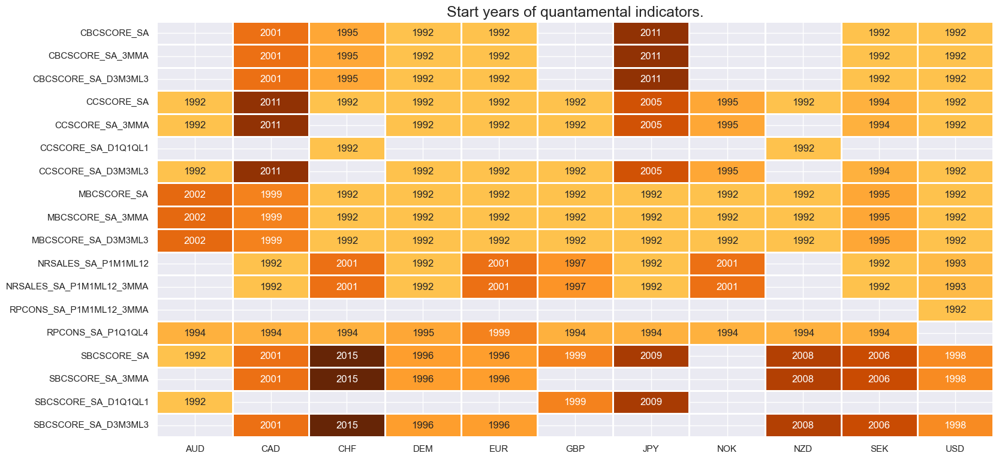

In [12]:
xcatx = confidence
msm.check_availability(df, xcats=xcatx, cids=cids, missing_recent=False)

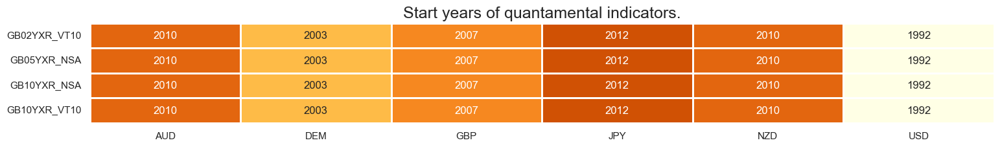

In [13]:
xcatx = rets
msm.check_availability(df, xcats=xcatx, cids=cids, missing_recent=False)

### Renamings

In [14]:
# Rename quarterly categories to equivalent monthly tickers

dict_repl = {
    "RPCONS_SA_P1Q1QL4": "RPCONS_SA_P1M1ML12_3MMA",
    "EMPL_NSA_P1Q1QL4" : "EMPL_NSA_P1M1ML12_3MMA",
    "UNEMPLRATE_NSA_D1Q1QL4" : "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "WAGES_NSA_P1Q1QL4" : "WAGES_NSA_P1M1ML12_3MMA", 
    "HPI_SA_P1Q1QL4": "HPI_SA_P1M1ML12_3MMA",
    "RHPI_SA_P1Q1QL4": "RHPI_SA_P1M1ML12_3MMA",
    "CCSCORE_SA_D1Q1QL1": "CCSCORE_SA_D3M3ML3",
    "SBCSCORE_SA_D1Q1QL1": "SBCSCORE_SA_D3M3ML3",
    "CBCSCORE_SA_D1Q1QL1": "CBCSCORE_SA_D3M3ML3",
    "MBCSCORE_SA_D1Q1QL1": "MBCSCORE_SA_D3M3ML3",
}

for key, value in dict_repl.items():
    dfx["xcat"] = dfx["xcat"].str.replace(key, value)

# Rename surveys of countries with quarterly data as equivalent monthly ones

cidx = list(set(cids_ecos) - set(dfx.loc[dfx['xcat'] == "SBCSCORE_SA_3MMA", :]['cid'].unique()))
dict_repl = {
"SBCSCORE_SA": "SBCSCORE_SA_3MMA"
}
for key, value in dict_repl.items():
    dfx.loc[dfx['cid'].isin(cidx), 'xcat'] = dfx.loc[dfx['cid'].isin(cidx), 'xcat'].str.replace(key, value)

cidx = list(set(cids_ecos) - set(dfx.loc[dfx['xcat'] == "CCSCORE_SA_3MMA", :]['cid'].unique()))
dict_repl = {
 "CCSCORE_SA": "CCSCORE_SA_3MMA"
}
for key, value in dict_repl.items():
    dfx.loc[dfx['cid'].isin(cidx), 'xcat'] = dfx.loc[dfx['cid'].isin(cidx), 'xcat'].str.replace(key, value)


In [15]:
# Stitching early and regular short-term core inflation

dict_merge = {
    "CPICC_SJA_P3M3ML3AR": ["CPICE_SJA_P3M3ML3AR", "CPIC_SJA_P3M3ML3AR"],
    "CPICC_SJA_P6M6ML6AR": ["CPICE_SJA_P6M6ML6AR", "CPIC_SJA_P6M6ML6AR"],
    "CPICC_SA_P1M1ML12": ["CPICE_SA_P1M1ML12", "CPIC_SA_P1M1ML12"],
    "CPIHC_SA_P1M1ML12": ["CPIHE_SA_P1M1ML12", "CPIH_SA_P1M1ML12"],
}
for key, value in dict_merge.items():
    dfa = merge_categories(dfx, value , key, cids_ecos)
    dfx = msm.update_df(dfx, dfa).reset_index(drop=True)

In [16]:
# # Define German bunds as euro area targets

# filt = dfx['xcat'].isin(rets) & (dfx['cid'] == "DEM")
# dfx.loc[filt, 'cid'] = dfx.loc[filt, "cid"].str.replace("DEM", "EUR")

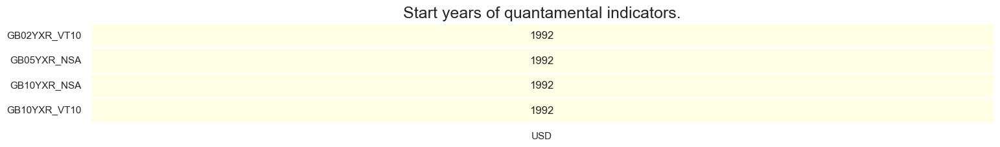

In [17]:
xcatx = rets
cidx = cids_gb
msm.check_availability(dfx, xcats=xcatx, cids=cidx, missing_recent=False)

In [18]:
# Backward-extension of INFTARGET_NSA

# Duplicate targets
cidx = cids_ecos
calcs = [f"INFTARGET_BX = INFTARGET_NSA"]
dfa = msp.panel_calculator(dfx, calcs, cids=cidx)

# Add all dates back to 1990 to the frame, filling "value " with NaN
all_dates = np.sort(dfx['real_date'].unique())
all_combinations = pd.DataFrame(
    list(itertools.product(dfa['cid'].unique(), dfa['xcat'].unique(), all_dates)),
    columns=['cid', 'xcat', 'real_date']
)
dfax = pd.merge(all_combinations, dfa, on=['cid', 'xcat', 'real_date'], how='left')

# Backfill the values with first target value
dfax = dfax.sort_values(by=['cid', 'xcat', 'real_date'])
dfax['value'] = dfax.groupby(['cid', 'xcat'])['value'].bfill()

dfx = msm.update_df(dfx, dfax)

# Extended effective inflation target by hierarchical merging

hierarchy = ["INFTEFF_NSA", "INFTARGET_BX"]
dfa = merge_categories(dfx, xcats=hierarchy, new_xcat="INFTEFF_BX")
dfx = msm.update_df(dfx, dfa)

## Transformations and checks

### Benchmarks

In [19]:
# Preparatory calculations
calcs = [
    "NGDP = RGDP_SA_P1Q1QL4_20QMM + INFTEFF_BX", # Expected nominal GDP growth
    "PROD = RGDP_SA_P1Q1QL4_20QMM - WFORCE_NSA_P1Y1YL1_5YMM", # Productivity growth trend
]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

xnomgrowth = list(dfa['xcat'].unique())

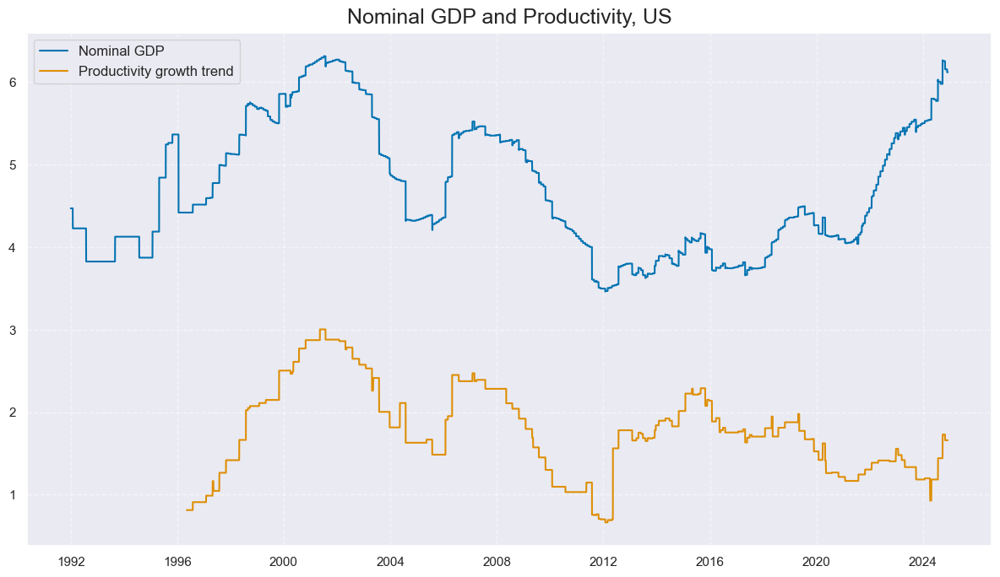

In [20]:
cidx = cids_gb
xcatx = ['NGDP', 'PROD']
# xnomgrowth

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    title='Nominal GDP and Productivity, US',
    start="1992-01-01",
    same_y=False,
    xcat_labels=['Nominal GDP', 'Productivity growth trend']
)

### Inflation shortfall

In [21]:
# Transformations

cidx = cids_ecos
calcs = []

infs = ["CPICC_SJA_P3M3ML3AR", "CPICC_SA_P1M1ML12", "CPIHC_SA_P1M1ML12", "CPICC_SJA_P6M6ML6AR", "INFE1Y_JA"]
wages = ["WAGES_NSA_P1M1ML12_3MMA"]

for xc in wages:
    calcs += [f"X{xc} = ( {xc} - PROD - INFTEFF_BX )" ]

for xc in infs:
    calcs += [f"X{xc} = ( {xc} - INFTEFF_BX )"]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

In [22]:
# Collect categories, labels, and presumed impact signs

cidx = cids_ecos
dict_base = {
    "XCPIHC_SA_P1M1ML12": "Excess headline CPI, %oya (negative)",
    "XCPICC_SA_P1M1ML12": "Excess core CPI, %oya (negative)",
    "XCPICC_SJA_P3M3ML3AR": "Excess core CPI, %3m/3m, saar (negative)",
    "XCPICC_SJA_P6M6ML6AR": "Excess core CPI, %6m/6m, saar (negative)",
    "XINFE1Y_JA": "Excess 1-year ahead inflation expectations, (negative)",
    "XWAGES_NSA_P1M1ML12_3MMA": " Excess wage growth, %oya, 3mma (negative)",
}

# Set correct signs for all categories and created amended dictionary

negs = [key for key, value in dict_base.items() if value.endswith("(negative)")]

calcs = []
for xc in negs:
    calcs += [f"{xc}_NEG = - {xc}"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

keys_sa = [
    key + "_NEG" if value.strip().endswith("(negative)") else key
    for key, value in dict_base.items()
]

dict_xinf = dict(zip(keys_sa, dict_base.values()))  # dict with correct keys and labels

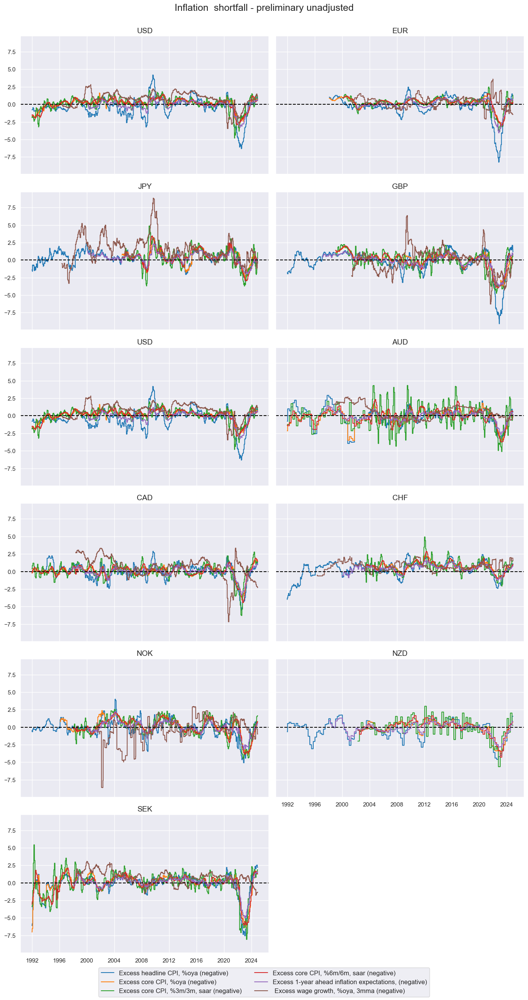

In [23]:
cidx = cids_ecos
xcatx = list(dict_xinf.keys())

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Inflation  shortfall - preliminary unadjusted',
    xcat_labels=list(dict_xinf.values())
)

In [24]:
# Calculate standardized and winsorized values based on all countries

cidx = cids_ecos
xcatx = list(dict_xinf.keys())
dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

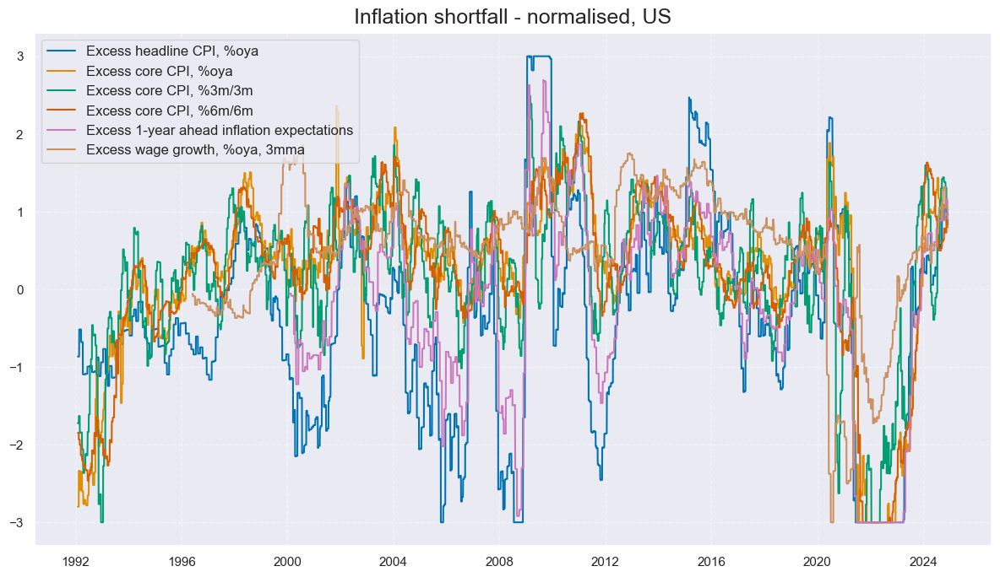

In [25]:
cidx = cids_gb
xcatx = [key + "_ZN" for key in list(dict_xinf.keys())]
labs = ['Excess headline CPI, %oya', 'Excess core CPI, %oya', 'Excess core CPI, %3m/3m', 'Excess core CPI, %6m/6m',
 'Excess 1-year ahead inflation expectations', 'Excess wage growth, %oya, 3mma']

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Inflation shortfall - normalised, US',
    xcat_labels=labs
)

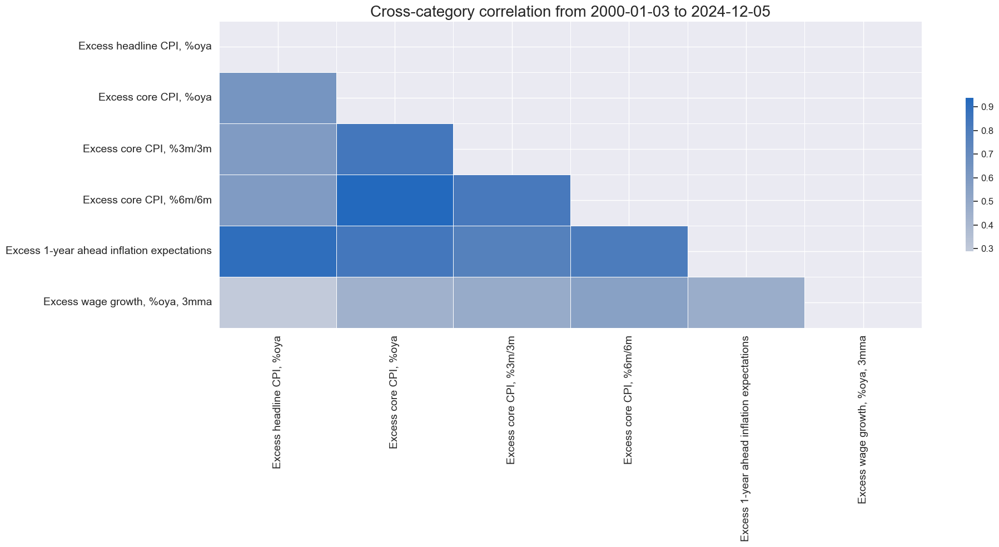

In [26]:
xcatx = [key + "_ZN" for key in list(dict_xinf.keys())]
cidx = cids_gb

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cidx,
    freq="M",
    size=(20, 10),
    xcat_labels = labs,
)

### Labor market slack

In [27]:
# Transformations

cidx = cids_ecos

calcs = [
    "XEMPL_NSA_P1M1ML12_3MMA = EMPL_NSA_P1M1ML12_3MMA - WFORCE_NSA_P1Y1YL1_5YMM",  # relative to workforce growth
]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

In [28]:
# Collect categories, labels, and presumed impact signs

cidx = cids_ecos
dict_base = {
    "UNEMPLRATE_SA_3MMAv5YMA": "Unemployment rate, %, 3mma versus 5yma",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12": "Unemployment rate, %, 3mma, change oya",
    "XEMPL_NSA_P1M1ML12_3MMA": "Employment growth, %oya, 3mma (negative)",
}

# Set correct signs for all categories and created amended dictionary

negs = [key for key, value in dict_base.items() if value.endswith("(negative)")]

calcs = []
for xc in negs:
    calcs += [f"{xc}_NEG = - {xc}"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

keys_sa = [
    key + "_NEG" if value.strip().endswith("(negative)") else key
    for key, value in dict_base.items()
]

dict_labs = dict(zip(keys_sa, dict_base.values()))  # dict with correct keys and labels

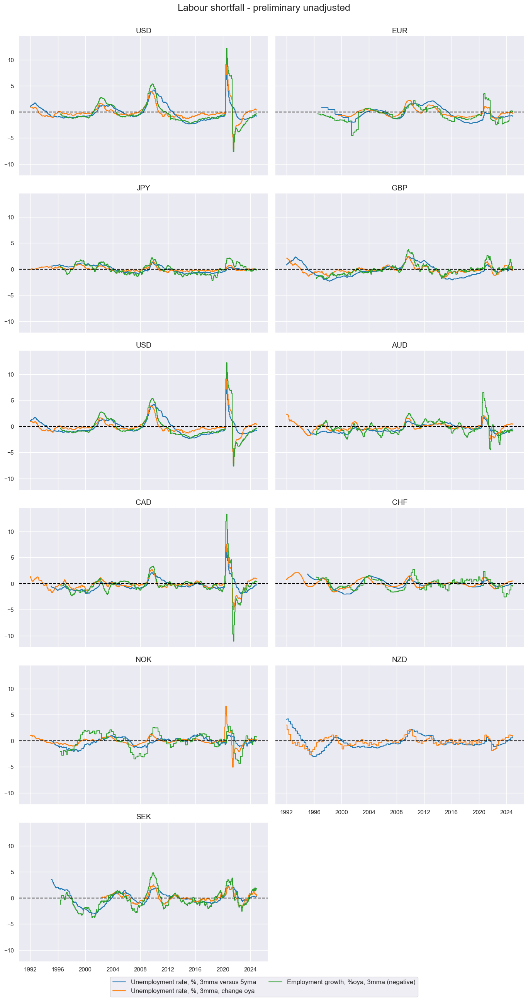

In [29]:
cidx = cids_ecos
xcatx = list(dict_labs.keys())

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Labour shortfall - preliminary unadjusted',
    xcat_labels=list(dict_labs.values())
)

In [30]:
# Calculate standardized and winsorized values based on all countries

cidx = cids_ecos
xcatx = list(dict_labs.keys())
dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

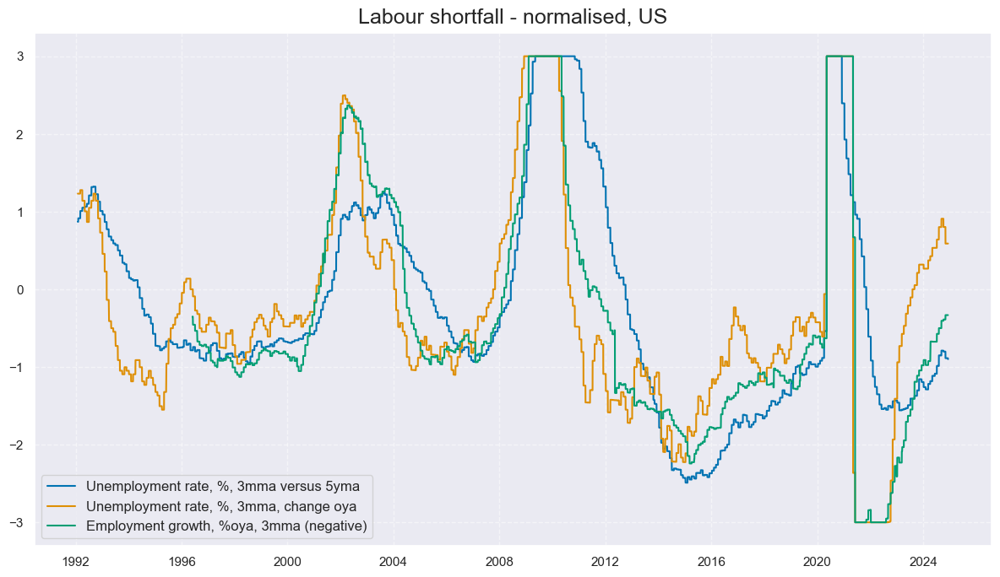

In [31]:
cidx = cids_gb
xcatx = [key + "_ZN" for key in list(dict_labs.keys())]
labs = list(dict_labs.values())

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Labour shortfall - normalised, US',
    xcat_labels=labs
)

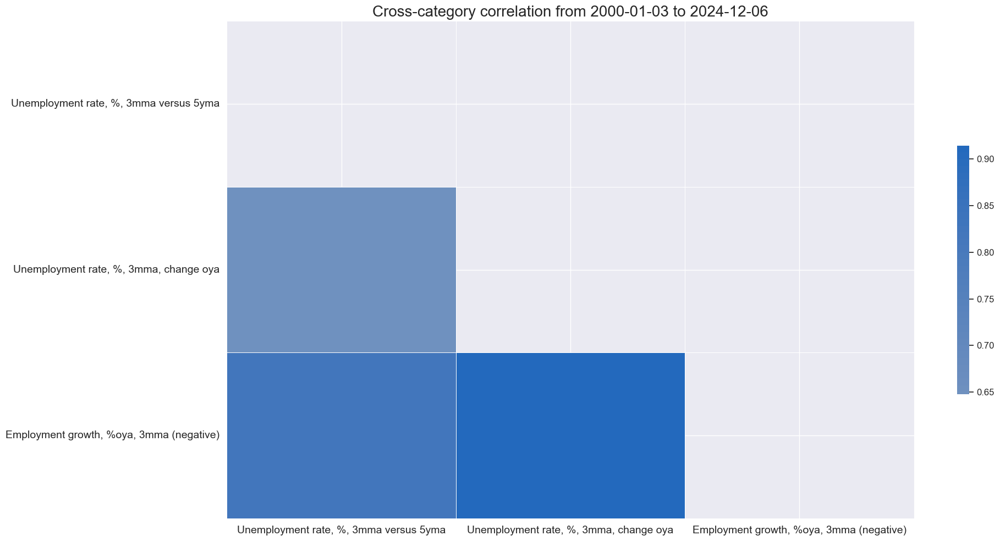

In [32]:
xcatx = [key + "_ZN" for key in list(dict_labs.keys())]
cidx = cids_gb

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cidx,
    freq="M",
    size=(20, 10),
    xcat_labels = labs,
)

### Growth and demand shortfall

In [33]:
# Transformations
cidx = cids_ecos

calcs = [
    "XNRSALES_SA_P1M1ML12_3MMA = NRSALES_SA_P1M1ML12_3MMA - NGDP", # excess nominal retail sales 
    "XIMPORTS_SA_P1M1ML12_3MMA = IMPORTS_SA_P1M1ML12_3MMA - NGDP", # Exces import growth
    "XRPCONS_SA_P1M1ML12_3MMA = RPCONS_SA_P1M1ML12_3MMA - RGDP_SA_P1Q1QL4_20QMM", # excess real private consumption
]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

In [34]:
# Collect categories, labels, and presumed impact signs

cidx = cids_ecos

dict_base = {
    "XNRSALES_SA_P1M1ML12_3MMA": "Excess nominal retail sales, %oya, 3mma (negative)",
    "XIMPORTS_SA_P1M1ML12_3MMA": "Excess nominal imports, %oya, 3mma (negative)",
    "XRPCONS_SA_P1M1ML12_3MMA": "Excess real private consumption, %oya, 3mma (negative)",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMA": "Excess GDP growth, intuitive nowcast, %oya, 3mma (negative)",
    "RGDPTECHv5Y_SA_P1M1ML12_3MMA": "Excess GDP growth, technical nowcast, %oya, 3mma (negative)",
}

# Set correct signs for all categories and created amended dictionary

negs = [key for key, value in dict_base.items() if value.endswith("(negative)")]

calcs = []
for xc in negs:
    calcs += [f"{xc}_NEG = - {xc}"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

keys_sa = [
    key + "_NEG" if value.strip().endswith("(negative)") else key
    for key, value in dict_base.items()
]

dict_xgds = dict(zip(keys_sa, dict_base.values()))  # dict with correct keys and labels

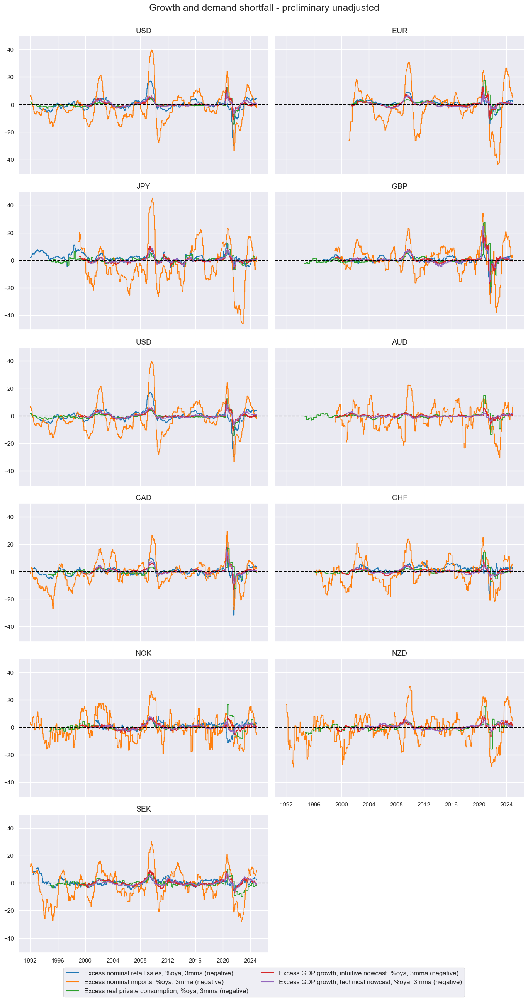

In [35]:
cidx = cids_ecos
xcatx = list(dict_xgds.keys())
labs=list(dict_xgds.values())

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Growth and demand shortfall - preliminary unadjusted',
    xcat_labels=labs
)

In [36]:
# Calculate standardized and winsorized values based on all countries

cidx = cids_ecos
xcatx = list(dict_xgds.keys())
dfa = pd.DataFrame(columns=list(dfx.columns))
labs = ['Excess nominal retail sales', 'Excess nominal imports', 'Excess real private consumption', 'Excess GDP growth, intuitive nowcast',
 'Excess GDP growth, technical nowcast']

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

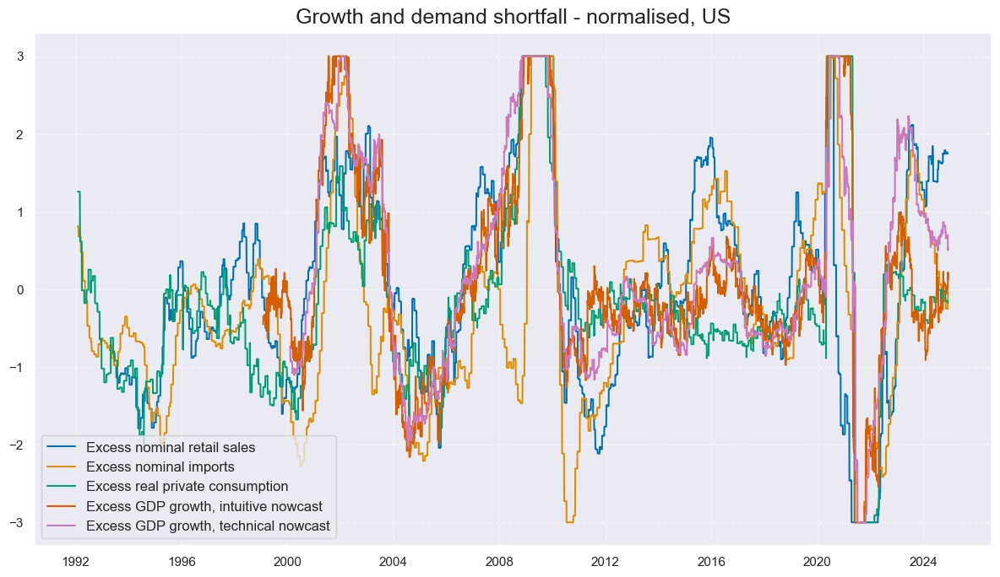

In [104]:
cidx = ["USD"]
xcatx = [key + "_ZN" for key in list(dict_xgds.keys())]
labs = [
    "Excess nominal retail sales",
    "Excess nominal imports",
    "Excess real private consumption",
    "Excess GDP growth, intuitive nowcast",
    "Excess GDP growth, technical nowcast",
]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title="Growth and demand shortfall - normalised, US",
    xcat_labels=labs,
)

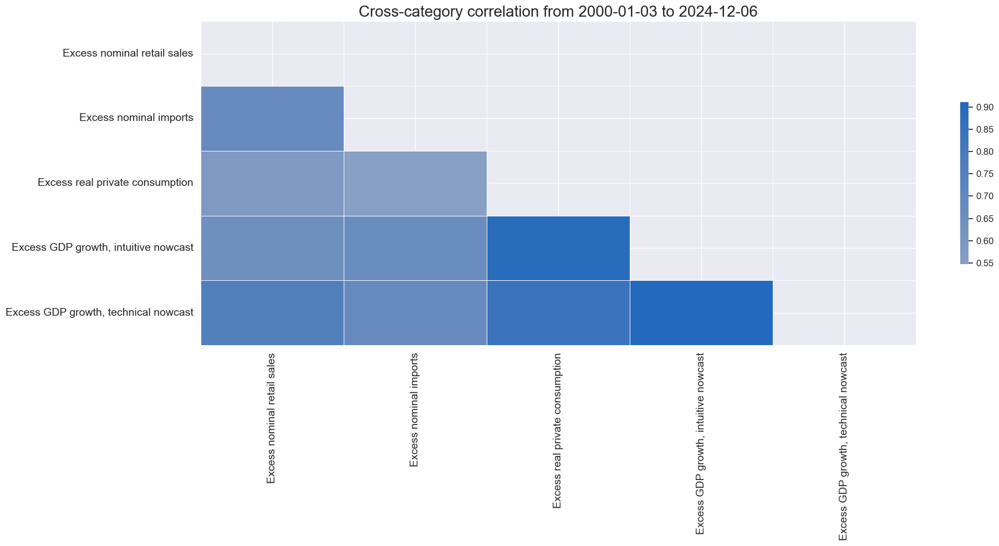

In [38]:
xcatx = [key + "_ZN" for key in list(dict_xgds.keys())]
cidx = cids_gb

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cidx,
    freq="M",
    size=(20, 10),
    xcat_labels = labs,
)

### Money and credit shortfall

In [39]:
# Transformations
cidx = cids_ecos

calcs = [
    # Excess money and credit growth
    "XMNARROW_SJA_P1M1ML12 = MNARROW_SJA_P1M1ML12 - NGDP",
    "XMBROAD_SJA_P1M1ML12 = MBROAD_SJA_P1M1ML12 - NGDP",
    "XPCREDITBN_SJA_P1M1ML12 = PCREDITBN_SJA_P1M1ML12 - NGDP",
    "XPCREDITGDP_SJA_D1M1ML12 = PCREDITGDP_SJA_D1M1ML12 - NGDP" # excess private bank credit
]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

xcred = list(dfa['xcat'].unique())

In [40]:
# Collect categories, labels, and presumed impact signs

cidx = cids_ecos
dict_base = {
    "XMBROAD_SJA_P1M1ML12": "Excess broad money growth, %oya (negative)",
    "XMNARROW_SJA_P1M1ML12": "Excess narrow money growth, %oya (negative)",
    "XPCREDITBN_SJA_P1M1ML12": "Excess private credit growth, %oya (negative)",
    "XPCREDITGDP_SJA_D1M1ML12": "Excess private credit, % of GDP, change oya (negative)",
}

# Set correct signs for all categories and created amended dictionary

negs = [key for key, value in dict_base.items() if value.endswith("(negative)")]

calcs = []
for xc in negs:
    calcs += [f"{xc}_NEG = - {xc}"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

keys_sa = [
    key + "_NEG" if value.strip().endswith("(negative)") else key
    for key, value in dict_base.items()
]

dict_mcrs = dict(zip(keys_sa, dict_base.values()))  # dict with correct keys and labels

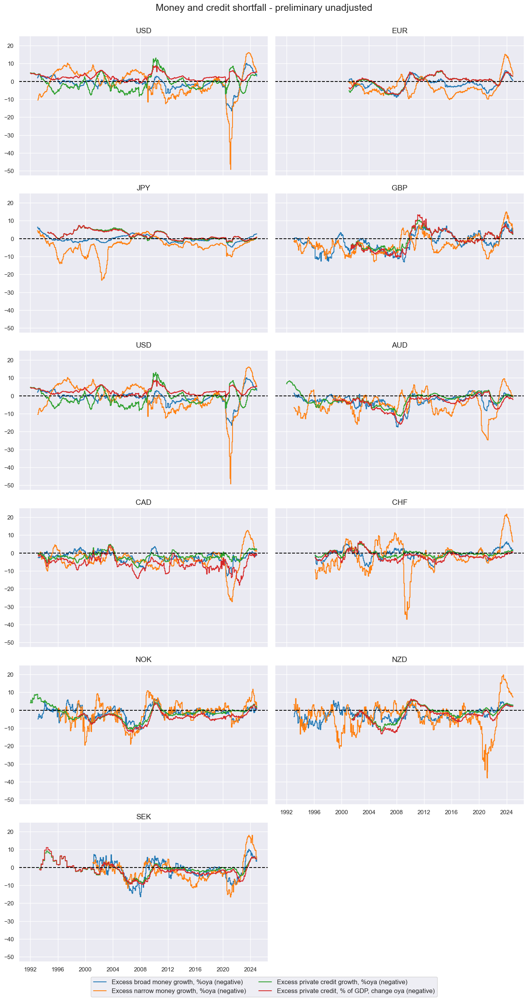

In [41]:
cidx = cids_ecos
xcatx = list(dict_mcrs.keys())
labs = list(dict_mcrs.values())

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Money and credit shortfall - preliminary unadjusted',
    xcat_labels=labs
)

In [42]:
# Calculate standardized and winsorized values based on all countries

cidx = cids_ecos
xcatx = list(dict_mcrs.keys())
dfa = pd.DataFrame(columns=list(dfx.columns))
labs = ['Excess broad money growth', 'Excess narrow money growth', 'Excess private credit growth', 'Excess private credit']

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

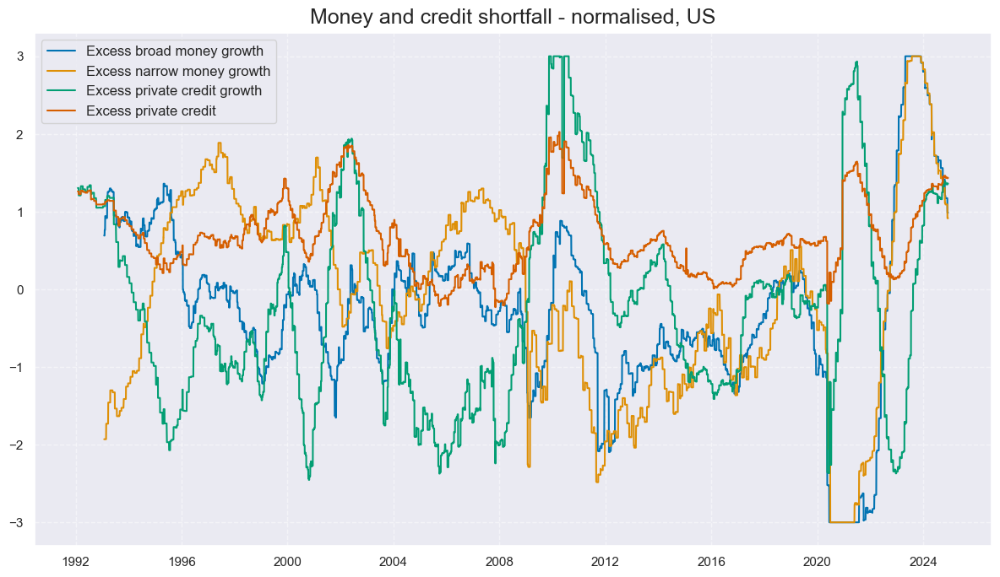

In [43]:
cidx = cids_gb
xcatx = [key + "_ZN" for key in list(dict_mcrs.keys())]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Money and credit shortfall - normalised, US',
    xcat_labels=labs
)

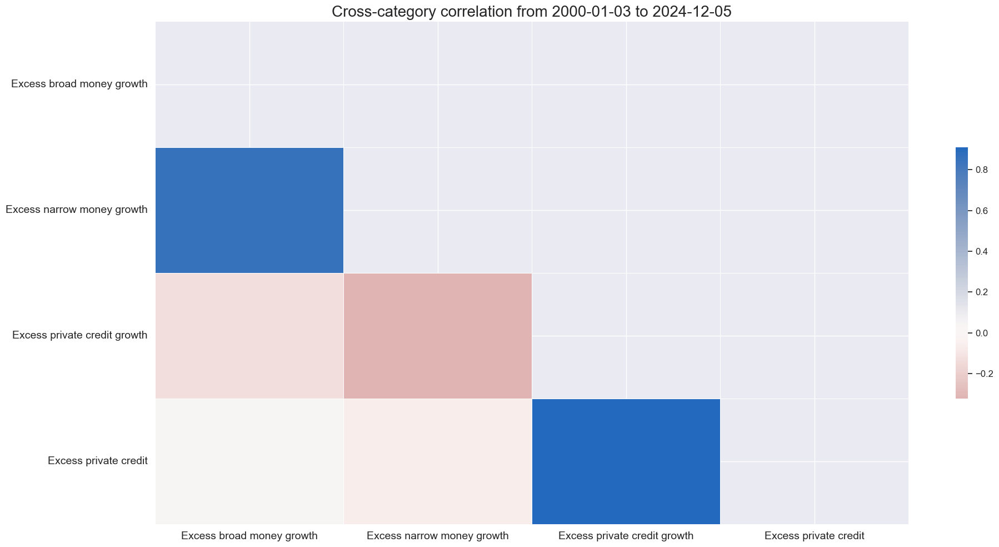

In [44]:
xcatx = [key + "_ZN" for key in list(dict_mcrs.keys())]
cidx = cids_gb

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cidx,
    freq="M",
    size=(20, 10),
    xcat_labels = labs,
)

### Economic sentiment shortfall

In [45]:
# Collect categories, labels, and presumed impact signs

cidx = cids_ecos
dict_base = {
        "MBCSCORE_SA_3MMA": "Manufacturing confidence score, sa, 3mma, (negative)",
        "CCSCORE_SA_3MMA": "Consumer confidence score, sa, 3mma, (negative)",
        "SBCSCORE_SA_3MMA": "Services confidence score, sa, 3mma, (negative)", 
        "CBCSCORE_SA_3MMA": "Construction confidence score, sa, 3mma, (negative)",
}

# Set correct signs for all categories and created amended dictionary

negs = [key for key, value in dict_base.items() if value.endswith("(negative)")]

calcs = []
for xc in negs:
    calcs += [f"{xc}_NEG = - {xc}"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

keys_sa = [
    key + "_NEG" if value.strip().endswith("(negative)") else key
    for key, value in dict_base.items()
]

dict_confs = dict(zip(keys_sa, dict_base.values()))  # dict with correct keys and labels

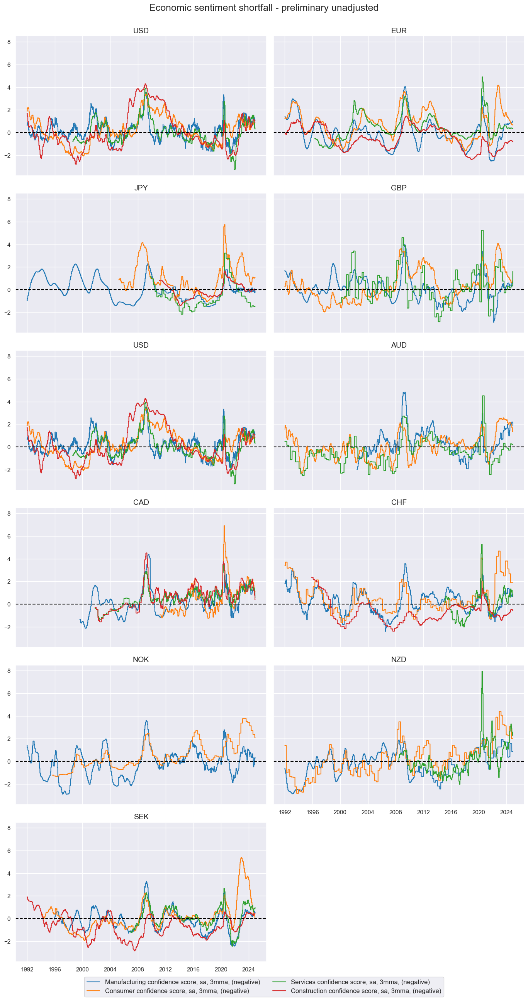

In [46]:
cidx = cids_ecos
xcatx = list(dict_confs.keys())
labs=list(dict_confs.values())

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Economic sentiment shortfall - preliminary unadjusted',
    xcat_labels=labs
)

In [47]:
# Calculate standardized and winsorized values based on all countries

cidx = cids_ecos
xcatx = list(dict_confs.keys())
dfa = pd.DataFrame(columns=list(dfx.columns))
labs = ['Manufacturing confidence score', 'Consumer confidence score', 'Services confidence score', 'Construction confidence score']

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

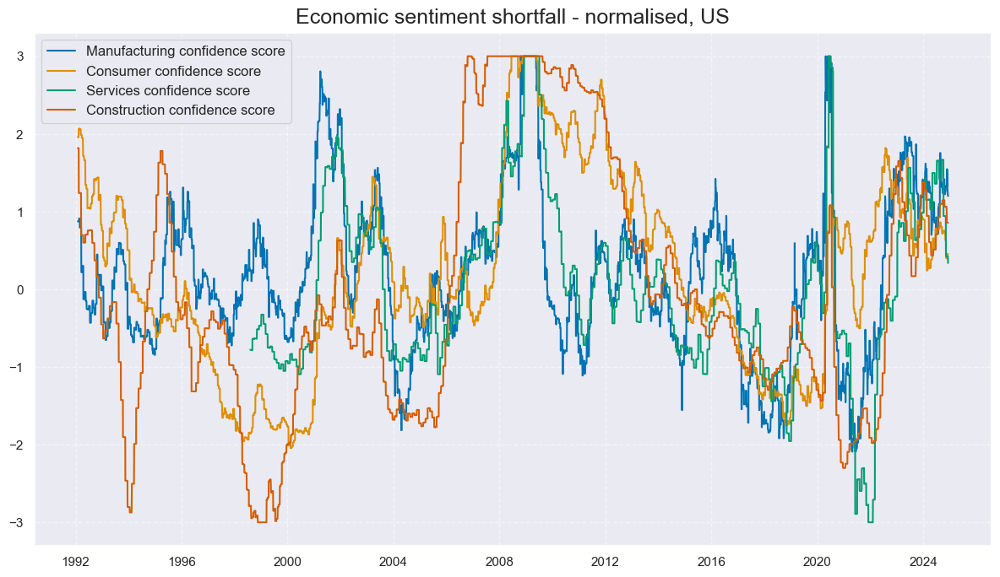

In [48]:
cidx = cids_gb
xcatx = [key + "_ZN" for key in list(dict_confs.keys())]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Economic sentiment shortfall - normalised, US',
    xcat_labels=labs
)

### Housing price shortfall

In [49]:
# Transformations

cidx = cids_ecos
calcs = ["XHPI_SA_P1M1ML12_3MMA = HPI_SA_P1M1ML12_3MMA - NGDP "] # excess house price growth]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

In [50]:
# Collect categories, labels, and presumed impact signs

cidx = cids_ecos
dict_base = {
    "XHPI_SA_P1M1ML12_3MMA": "Excess housing price growth, %oya (negative)",
    "RHPI_SA_P1M1ML12_3MMA": "Excess real housing price growth, %oya (negative)",
}

# Set correct signs for all categories and created amended dictionary

negs = [key for key, value in dict_base.items() if value.endswith("(negative)")]

calcs = []
for xc in negs:
    calcs += [f"{xc}_NEG = - {xc}"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

keys_sa = [
    key + "_NEG" if value.strip().endswith("(negative)") else key
    for key, value in dict_base.items()
]

dict_hpis = dict(zip(keys_sa, dict_base.values()))  # dict with correct keys and labels

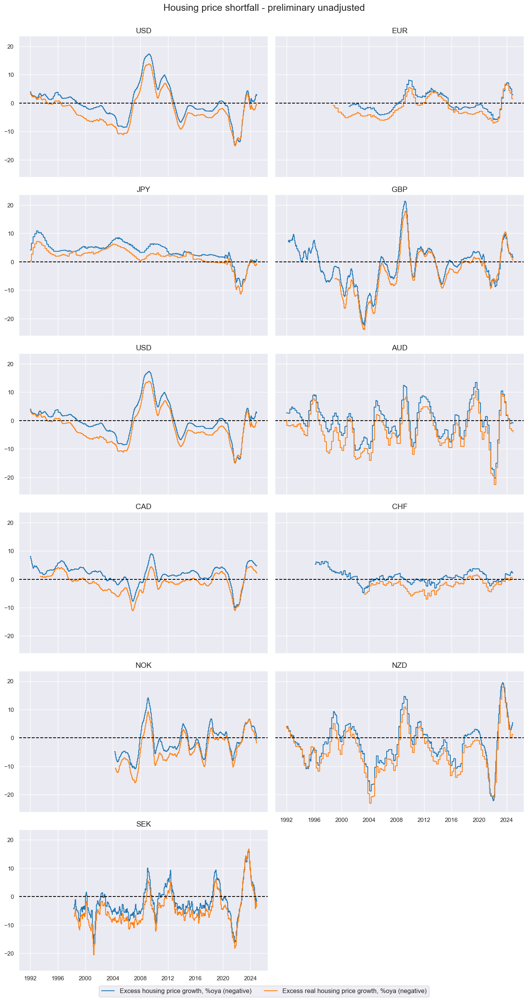

In [51]:
cidx = cids_ecos
xcatx = list(dict_hpis.keys())
labs=list(dict_hpis.values())

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Housing price shortfall - preliminary unadjusted',
    xcat_labels=labs
)

In [52]:
# Calculate standardized and winsorized values based on all countries

cidx = cids_ecos
xcatx = list(dict_hpis.keys())
dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

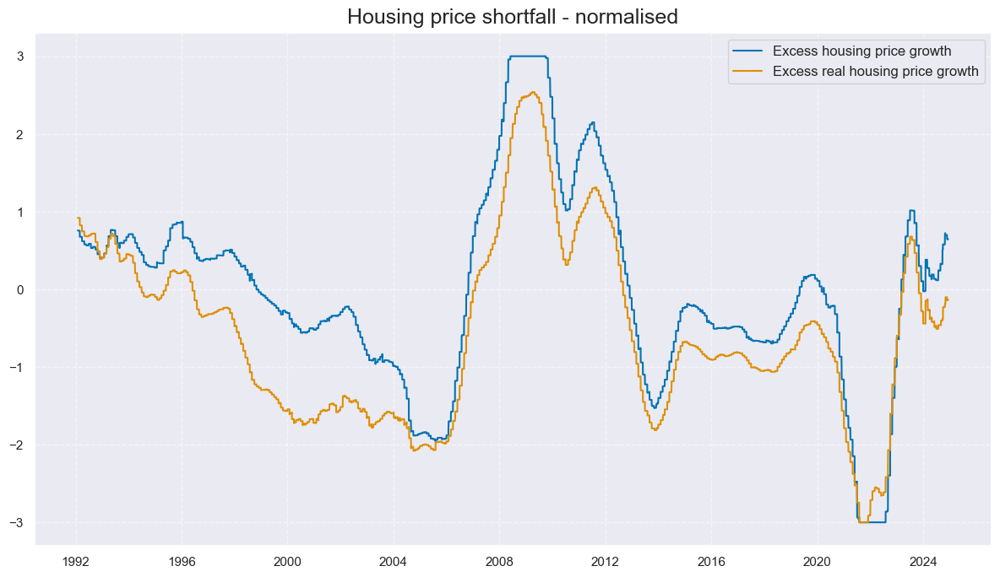

In [53]:
cidx = cids_gb
xcatx = [key + "_ZN" for key in list(dict_hpis.keys())]
labs=['Excess housing price growth', 'Excess real housing price growth']

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Housing price shortfall - normalised',
    xcat_labels=labs
)

## Trend modification scores

#### Conceptual macro scores

In [54]:
cidx = cids_ecos

dict_all = {
    "INFSHORT": [dict_xinf, "Inflation shortfall"],
    "LABSLACK": [dict_labs, "Labor market slack"],
    "GRDSHORT": [dict_xgds, "Growth and demand shortfall"],
    "MCRSHORT": [dict_mcrs, "Money and credit shortfall"],
    "SENTSHORT": [dict_confs, "Economic sentiment shortfall"],
    "HPISHORT": [dict_hpis, "Housing price shortfall"],
}
dict_labels = {key: value[1] for key, value in dict_all.items()}

dfa = pd.DataFrame(columns=list(dfx.columns))

for key, value in dict_all.items():
    xcatx = [key + "_ZN" for key in list(value[0].keys())]
    dfa1 = msp.linear_composite(
        df=dfx, xcats=xcatx, cids=cidx, complete_xcats=False, new_xcat=key
    )
    dfa2 = msp.make_zn_scores(
        dfa1,
        xcat=key,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfa2)

dfx = msm.update_df(dfx, dfa)

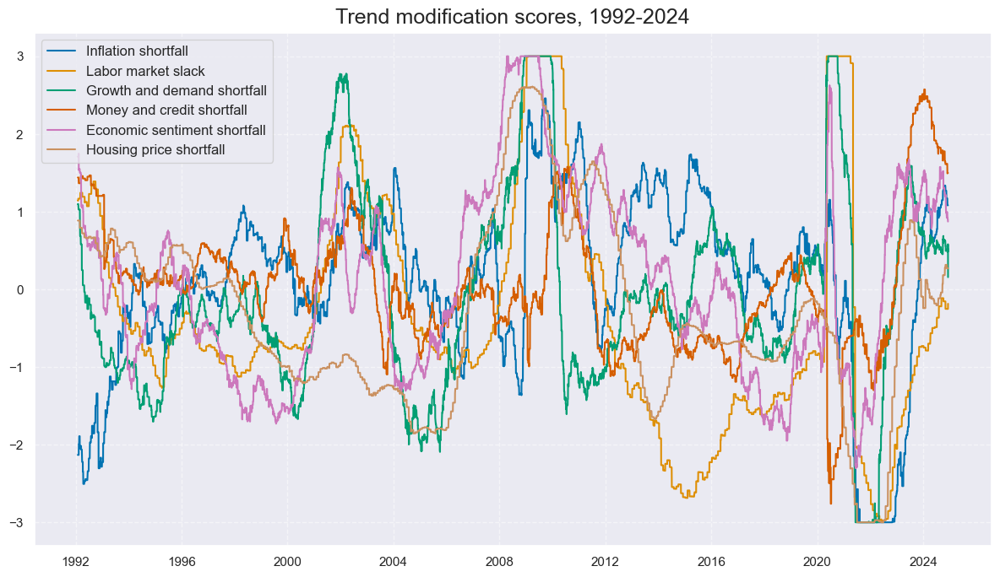

In [55]:
cidx = cids_gb
xcatx = [key + "_ZN" for key in list(dict_all.keys())]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Trend modification scores, 1992-2024',
    xcat_labels=list(dict_labels.values())
)

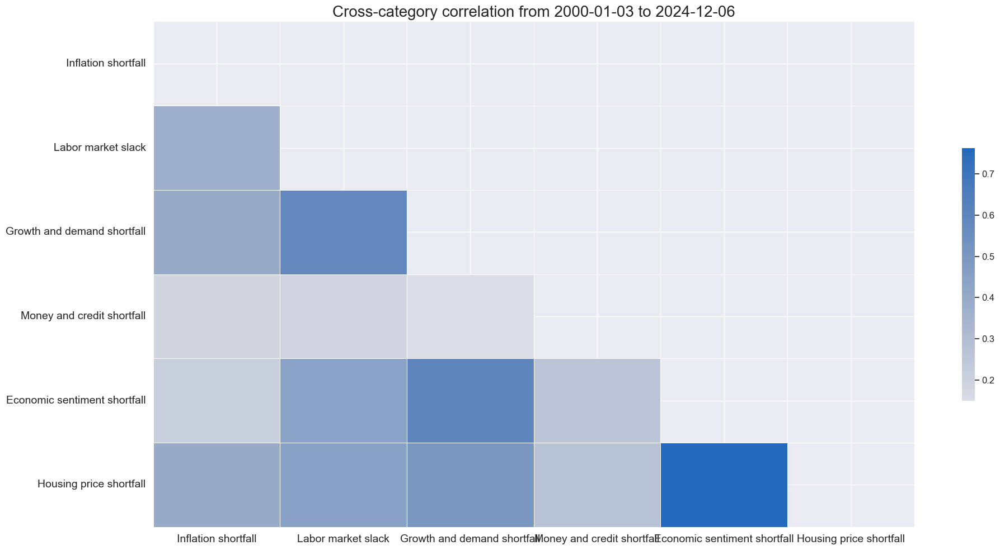

In [56]:
xcatx = [key + "_ZN" for key in list(dict_all.keys())]
cidx = cids_gb

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cidx,
    freq="M",
    size=(20, 10),
    xcat_labels = list(dict_labels.values()),
)

### Composite macro scores

In [57]:
cidx = cids_ecos
xcatx = [key + "_ZN" for key in dict_all.keys()]
dfa1 = msp.linear_composite(
        df=dfx, xcats=xcatx, cids=cidx, complete_xcats=False, new_xcat="ALL_CZS"
    )
dfa2 = msp.make_zn_scores(
        dfa1,
        xcat="ALL_CZS",
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )

dfx = msm.update_df(dfx, dfa2)

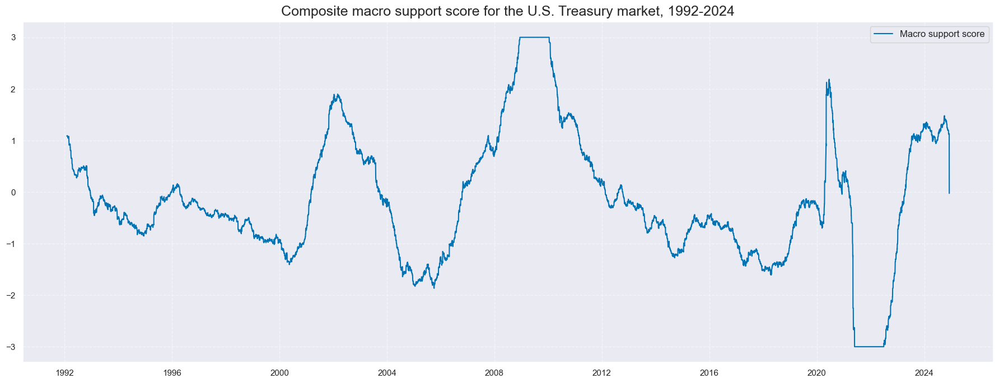

In [105]:
cidx = cids_gb
xcatx = ["ALL_CZS_ZN"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=["USD"],
    start="1992-01-01",
    title="Composite macro support score for the U.S. Treasury market, 1992-2024",
    size=(18, 7),
    xcat_labels=['Macro support score']
)

In [59]:
# Negative score as convenience ticker for curve signal

cidx = cids_ecos
xcatx = [key + "_ZN" for key in dict_all.keys()] + ["ALL_CZS_ZN",]

dfa = pd.DataFrame(columns=list(dfx.columns))
for xc in xcatx:
    calcs = [
        f"{xc}_NEG = - {xc} ",
    ]
    dfaa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

## Return trends and adjustments

#### Modified bond trends

In [60]:
calcs = [
    # Moving Cumulative rets 5-year
    "GB05YXR_NSAI = GB05YXR_NSA.cumsum()",
    "GB05YXR_STMAV = GB05YXR_NSAI.rolling(20).mean()",
    "GB05YXR_LTMAV = GB05YXR_NSAI.rolling(100).mean()",
    # 2s10s
    "GB10v2VTXR = GB10YXR_VT10 - GB02YXR_VT10 ", 
    "GB10v2VTXRCUM = GB10v2VTXR.cumsum()",
    "GB10v2VTXR_STMAV = GB10v2VTXRCUM.rolling(50).mean()",
    "GB10v2VTXR_LTMAV = GB10v2VTXRCUM.rolling(200).mean()",
    # Trends
    "GB05YXR_TREND = GB05YXR_STMAV - GB05YXR_LTMAV",
    "GB10v02YXR_TREND = GB10v2VTXR_STMAV - GB10v2VTXR_LTMAV",
]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids)
dfx = msm.update_df(dfx, dfa)

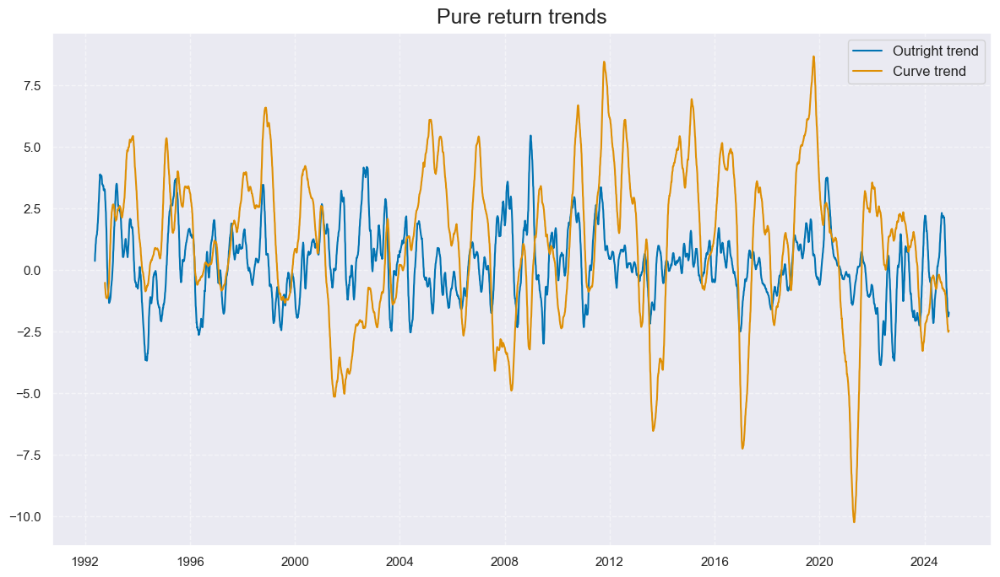

In [61]:
cidx = cids_gb
xcatx = ["GB05YXR_TREND", "GB10v02YXR_TREND"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Pure return trends',
    xcat_labels=['Outright trend','Curve trend']
)

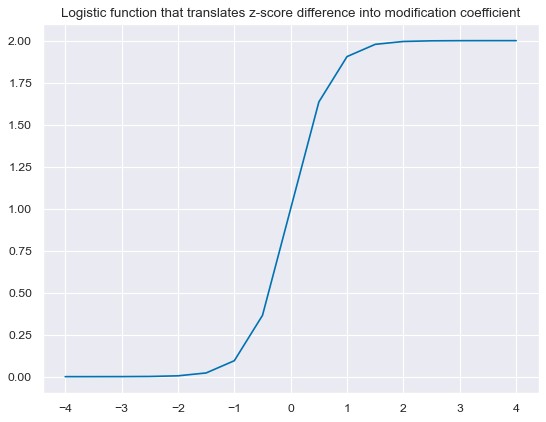

In [62]:
def sigmoid(x):
    return 2 / (1 + np.exp(-3 * x))

ar = np.array([i/2 for i in range(-8, 9)])
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(ar, sigmoid(ar))
plt.title(
    "Logistic function that translates z-score difference into modification coefficient"
)
plt.show()

In [63]:
cidx = cids_gb
calcs = [
    f"ALL_WIND = 2 / (1 + np.exp( - 3 * ALL_CZS_ZN )) ",
    f"ALL_DIR_ADF = (1 - np.sign( GB05YXR_TREND )) + np.sign( GB05YXR_TREND ) * ALL_WIND ",
    f"ALL_CRV_ADF = (1 - np.sign( GB10v02YXR_TREND )) + np.sign( GB10v02YXR_TREND ) * ( 2 - ALL_WIND )  ",
    f"GB05YXR_MODTREND_ALL = GB05YXR_TREND * ALL_DIR_ADF ",
    f"GB10v02YXR_MODTREND_ALL = GB10v02YXR_TREND * ALL_CRV_ADF ",
]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)

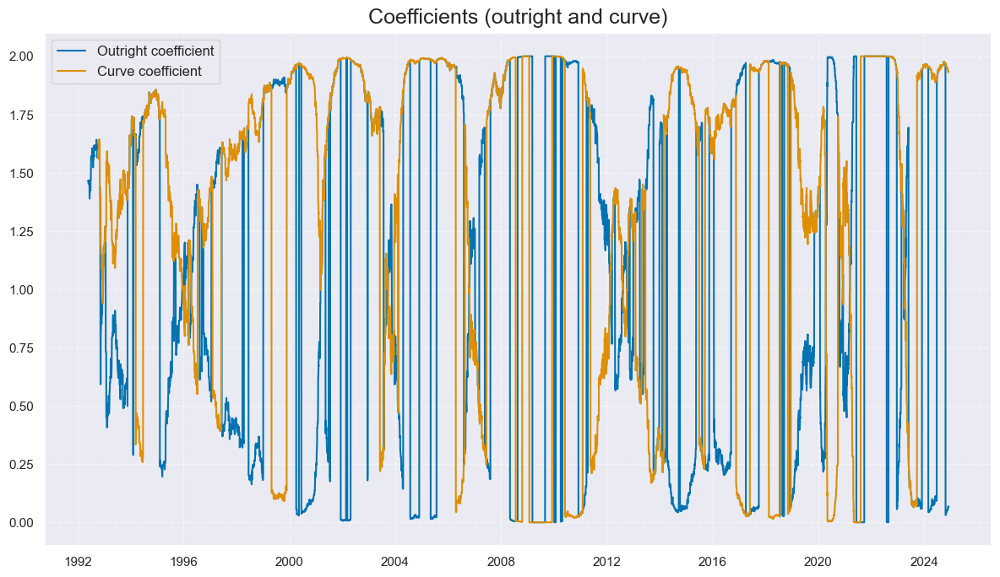

In [64]:
cidx = cids_gb
xcatx = ["ALL_DIR_ADF", "ALL_CRV_ADF"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=2,
    start="1992-01-01",
    same_y=True,
    title='Coefficients (outright and curve)',
    xcat_labels=['Outright coefficient','Curve coefficient']
)

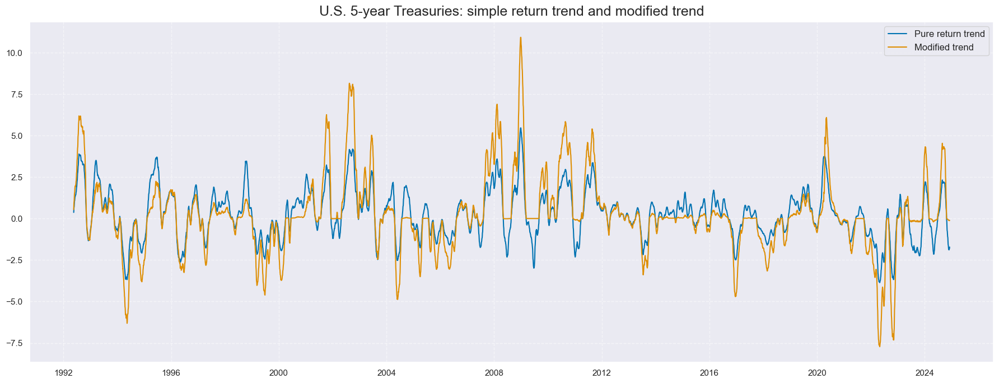

In [110]:
cidx = cids_gb
xcatx = ["GB05YXR_TREND", "GB05YXR_MODTREND_ALL"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="1992-01-01",
    title="U.S. 5-year Treasuries: simple return trend and modified trend",
    size=(18, 7),
   xcat_labels=["Pure return trend", "Modified trend"],
)

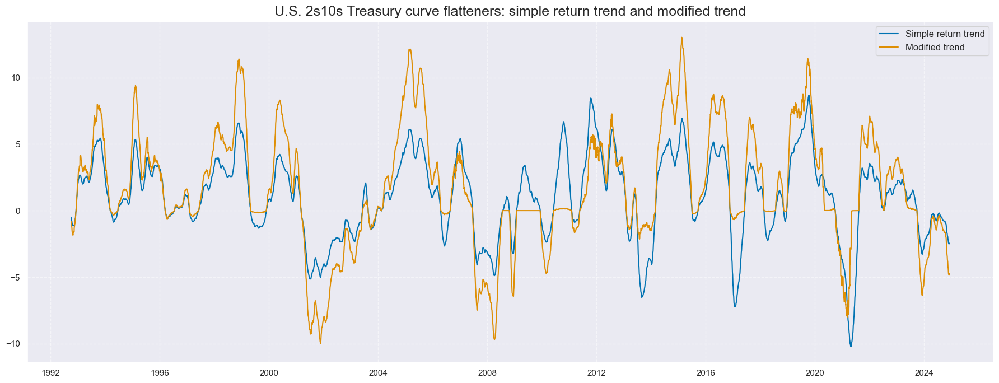

In [117]:
cidx = cids_gb
xcatx = ["GB10v02YXR_TREND", "GB10v02YXR_MODTREND_ALL"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="1992-01-01",
    title="U.S. 2s10s Treasury curve flatteners: simple return trend and modified trend",
    size=(18, 7),
    xcat_labels=["Simple return trend", "Modified trend"],
)

In [67]:
# Normalization (mainly for comparability in charts)

xcatx = ["GB05YXR_MODTREND_ALL", "GB10v02YXR_MODTREND_ALL"]
cidx = cids_gb

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=0,  # use country history
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

#### Balanced bond trends

In [68]:
xcatx = ['GB05YXR_TREND', 'GB10v02YXR_TREND']
cidx = cids_gb

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=0,  # use country history
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

In [69]:
cidx = cids_gb

xcatx = ["GB05YXR_TREND_ZN", "ALL_CZS_ZN"]
dfa1 = msp.linear_composite(
    df=dfx, xcats=xcatx, cids=cidx, complete_xcats=True, new_xcat="GB05YXR_BALTREND_ALL"
)
dfx = msm.update_df(dfx, dfa1)

xcatx = ["GB10v02YXR_TREND_ZN", "ALL_CZS_ZN"]
dfa2 = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    signs=[1, -1],
    complete_xcats=True,
    new_xcat="GB10v02YXR_BALTREND_ALL",
)
dfx = msm.update_df(dfx, dfa2)

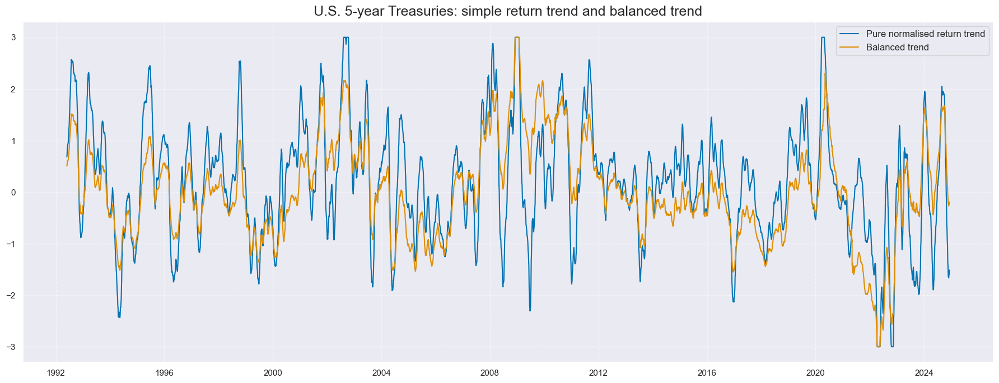

In [121]:
cidx = cids_gb
xcatx = ["GB05YXR_TREND_ZN", "GB05YXR_BALTREND_ALL"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="1992-01-01",
    title="U.S. 5-year Treasuries: simple return trend and balanced trend",
    size=(18, 7),
    xcat_labels=["Pure normalised return trend", "Balanced trend"],
)

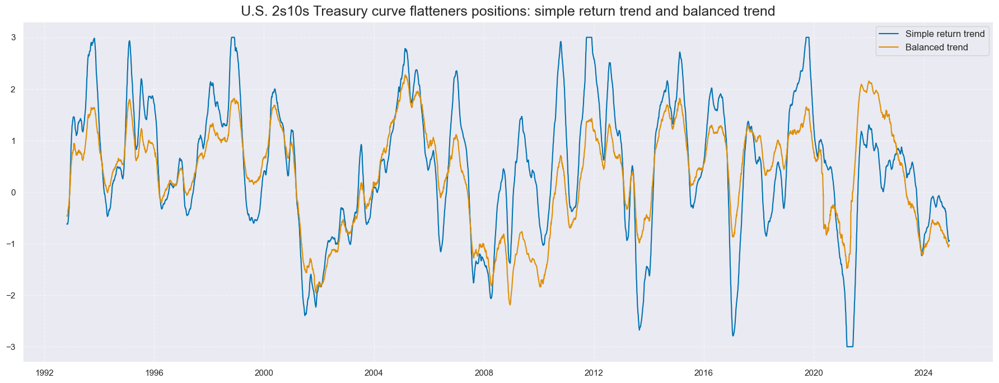

In [118]:
cidx = cids_gb
xcatx = ["GB10v02YXR_TREND_ZN", "GB10v02YXR_BALTREND_ALL"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    start="1992-01-01",
    title="U.S. 2s10s Treasury curve flatteners positions: simple return trend and balanced trend",
    size=(18, 7),
    xcat_labels=["Simple return trend", "Balanced trend"],
)

### Relations between trends

#### Outright trends

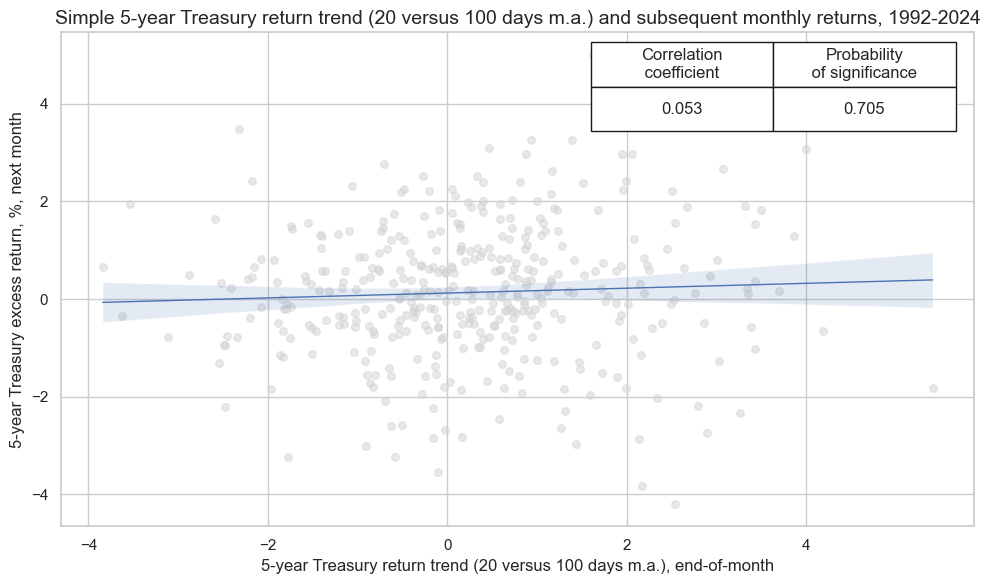

In [107]:
cidx = cids_gb
sig = 'GB05YXR_TREND'
ret = 'GB05YXR_NSA'

crx_mat = msp.CategoryRelations(
    dfx,
    xcats=[sig, ret],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"]
)
crx_mat.reg_scatter(
    labels=False,
    coef_box="upper right",
    title='Simple 5-year Treasury return trend (20 versus 100 days m.a.) and subsequent monthly returns, 1992-2024',
    size=(10, 6),
    xlab="5-year Treasury return trend (20 versus 100 days m.a.), end-of-month",
    ylab="5-year Treasury excess return, %, next month",
)

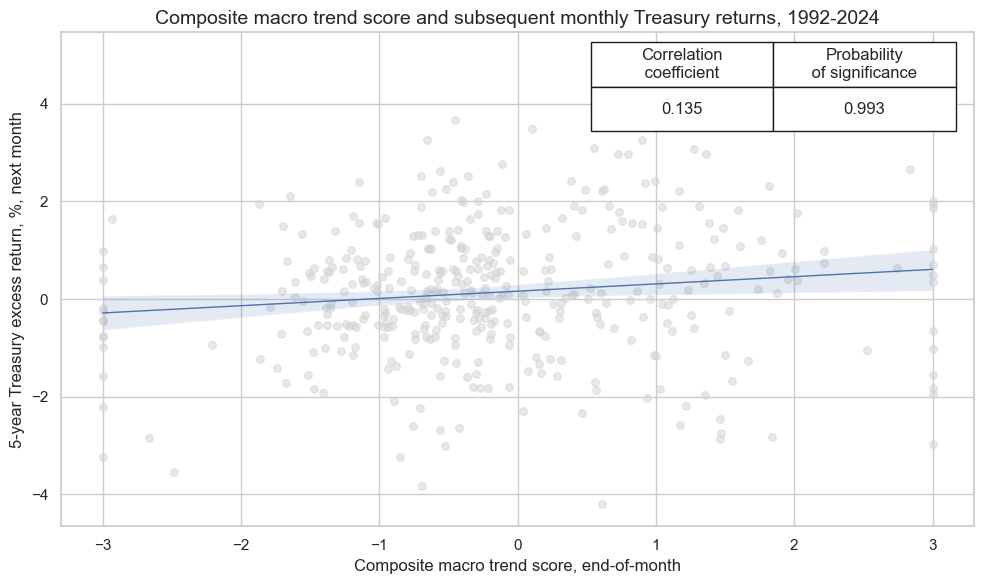

In [108]:
cidx = cids_gb
sig = 'ALL_CZS_ZN'
ret = 'GB05YXR_NSA'

crx_mat = msp.CategoryRelations(
    dfx,
    xcats=[sig, ret],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"]
)
crx_mat.reg_scatter(
    labels=False,
    coef_box="upper right",
    title='Composite macro trend score and subsequent monthly Treasury returns, 1992-2024',
    size=(10, 6),
    xlab="Composite macro trend score, end-of-month",
    ylab="5-year Treasury excess return, %, next month",
)

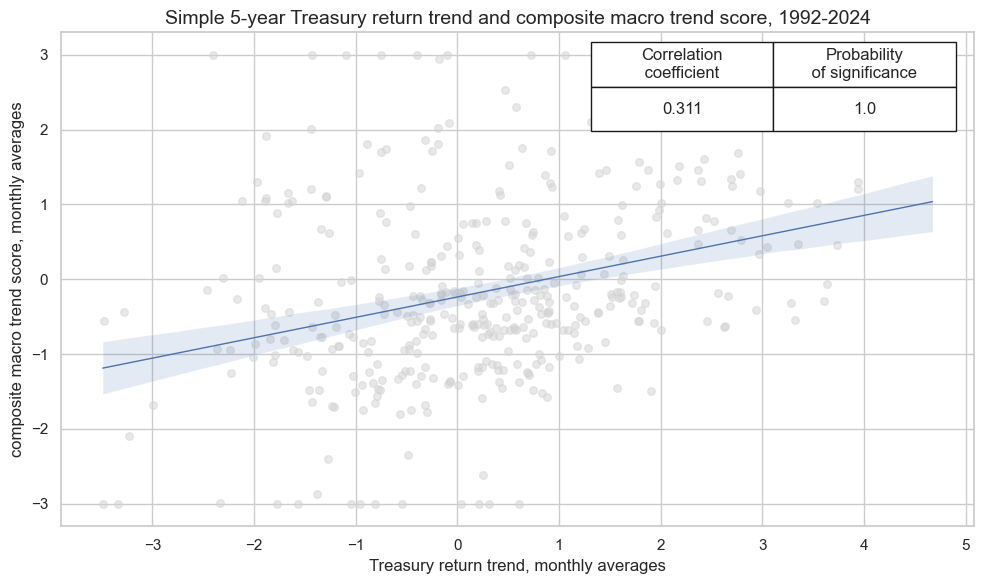

In [109]:
cidx = cids_gb
sig = 'GB05YXR_TREND'
ret = 'ALL_CZS_ZN'

crx_mat = msp.CategoryRelations(
    dfx,
    xcats=[sig, ret],
    cids=cidx,
    freq="M",
    lag=0,
    xcat_aggs=["mean", "mean"]
)
crx_mat.reg_scatter(
    labels=False,
    coef_box="upper right",
    title='Simple 5-year Treasury return trend and composite macro trend score, 1992-2024',
    size=(10, 6),
    prob_est="map",
    xlab="Treasury return trend, monthly averages",
    ylab="composite macro trend score, monthly averages",
)

### Curve trends

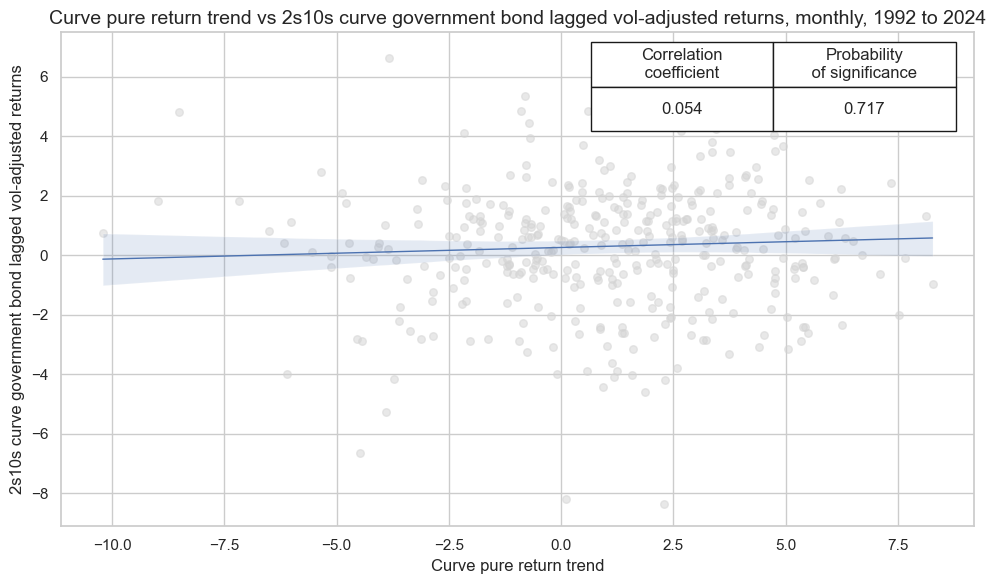

In [75]:
cidx = cids_gb
sig = 'GB10v02YXR_TREND'
ret = 'GB10v2VTXR'

crx_mat = msp.CategoryRelations(
    dfx,
    xcats=[sig, ret],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"]
)
crx_mat.reg_scatter(
    labels=False,
    coef_box="upper right",
    xlab="Curve pure return trend",
    ylab="2s10s curve government bond lagged vol-adjusted returns",
    title='Curve pure return trend vs 2s10s curve government bond lagged vol-adjusted returns, monthly, 1992 to 2024',
    size=(10, 6),
    prob_est="map",
)

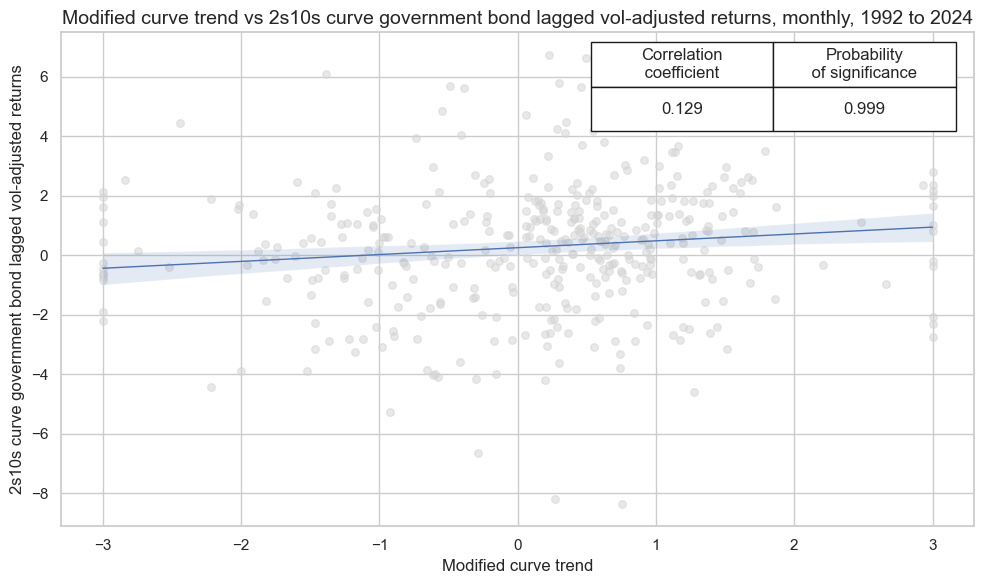

In [76]:
cidx = cids_gb
sig = 'ALL_CZS_ZN_NEG'
ret = 'GB10v2VTXR'

crx_mat = msp.CategoryRelations(
    dfx,
    xcats=[sig, ret],
    cids=cidx,
    freq="M",
    lag=1,
    xcat_aggs=["last", "sum"]
)
crx_mat.reg_scatter(
    labels=False,
    coef_box="upper right",
    xlab="Modified curve trend",
    ylab="2s10s curve government bond lagged vol-adjusted returns",
    title='Modified curve trend vs 2s10s curve government bond lagged vol-adjusted returns, monthly, 1992 to 2024',
    size=(10, 6),
    prob_est="map",
)

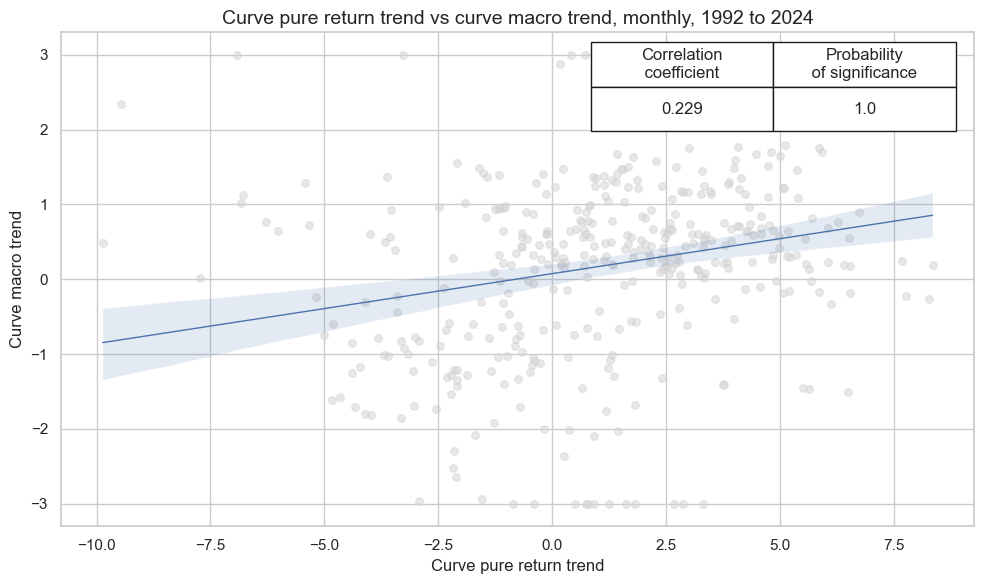

In [77]:
cidx = cids_gb
sig = 'GB10v02YXR_TREND'
ret = 'ALL_CZS_ZN_NEG'

crx_mat = msp.CategoryRelations(
    dfx,
    xcats=[sig, ret],
    cids=cidx,
    freq="M",
    lag=0,
    xcat_aggs=["mean", "mean"]
)
crx_mat.reg_scatter(
    labels=False,
    coef_box="upper right",
    xlab="Curve pure return trend",
    ylab="Curve macro trend",
    title='Curve pure return trend vs curve macro trend, monthly, 1992 to 2024',
    size=(10, 6),
    prob_est="map",
)

## Value check

### Directional trend signals

#### Specs and panel tests

In [78]:
sigs = [
    "GB05YXR_TREND_ZN",
    "GB05YXR_MODTREND_ALL_ZN",
    "GB05YXR_BALTREND_ALL",
    "ALL_CZS_ZN",
]
targ = ["GB05YXR_NSA"]
cidx = cids_gb
start = "1992-01-01"

dict_dir = {
    "sigs": sigs,
    "targs": targ,
    "cidx": cidx,
    "start": start,
    "srr": None,
    "pnls": None,
}

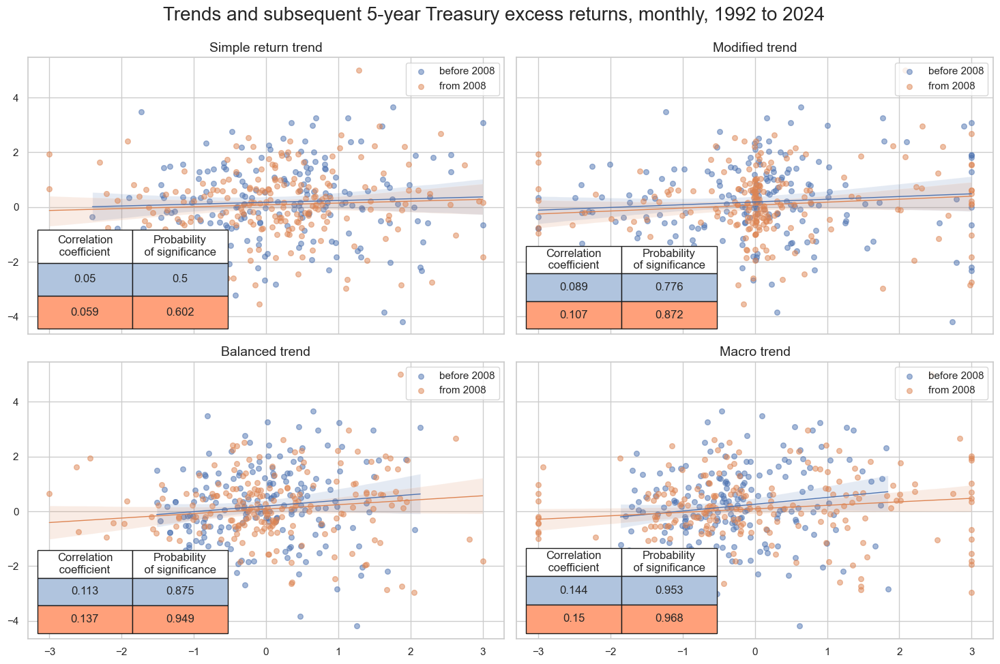

In [112]:
dix = dict_dir

sigs = dix["sigs"]
targ = dix["targs"][0]
cidx = dix["cidx"]
start = dix["start"]

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title="Trends and subsequent 5-year Treasury excess returns, monthly, 1992 to 2024",
    ylab=None,
    ncol=2,
    nrow=2,
    separator=2008,
    figsize=(15, 10),
    prob_est="pool",
    coef_box="lower left",
    subplot_titles=[
        "Simple return trend",
        "Modified trend",
        "Balanced trend",
        "Macro trend",
    ],
)

#### Accuracy and correlation check

In [ ]:
dix = dict_dir

sigx = dix["sigs"]
targx = [dix["targs"][0]]
cidx = dix["cidx"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    freqs="M",
    start=start,
)

dix["srr"] = srr

accuracy  \
Return      Signal                  Frequency Aggregation             
GB05YXR_NSA ALL_CZS_ZN              M         last            0.524   
            GB05YXR_BALTREND_ALL    M         last            0.547   
            GB05YXR_MODTREND_ALL_ZN M         last            0.552   
            GB05YXR_TREND_ZN        M         last            0.552   

                                                           bal_accuracy  \
Return      Signal                  Frequency Aggregation                 
GB05YXR_NSA ALL_CZS_ZN              M         last                0.540   
            GB05YXR_BALTREND_ALL    M         last                0.548   
            GB05YXR_MODTREND_ALL_ZN M         last                0.547   
            GB05YXR_TREND_ZN        M         last                0.547   

                                                           pos_sigr  pos_retr  \
Return      Signal                  Frequency Aggregation                       
GB05YXR_NSA ALL_CZS_ZN              M         last            0.359     0.547   
            GB05YXR_BALTREND_ALL    M         last            0.488     0.547   
            GB05YXR_MODTREND_ALL_ZN M         last            0.565     0.547   
            GB05YXR_TREND_ZN        M         last            0.565     0.547   

                                                           pos_prec  neg_prec  \
Return      Signal                  Frequency Aggregation                       
GB05YXR_NSA ALL_CZS_ZN              M         last            0.599     0.482   
            GB05YXR_BALTREND_ALL    M         last            0.597     0.500   
            GB05YXR_MODTREND_ALL_ZN M         last            0.588     0.506   
            GB05YXR_TREND_ZN        M         last            0.588     0.506   

                                                           pearson  \
Return      Signal                  Frequency Aggregation            
GB05YXR_NSA ALL_CZS_ZN              M         last           0.135   
            GB05YXR_BALTREND_ALL    M         last           0.122   
            GB05YXR_MODTREND_ALL_ZN M         last           0.096   
            GB05YXR_TREND_ZN        M         last           0.056   

                                                           pearson_pval  \
Return      Signal                  Frequency Aggregation                 
GB05YXR_NSA ALL_CZS_ZN              M         last                0.007   
            GB05YXR_BALTREND_ALL    M         last                0.016   
            GB05YXR_MODTREND_ALL_ZN M         last                0.058   
            GB05YXR_TREND_ZN        M         last                0.267   

                                                           kendall  \
Return      Signal                  Frequency Aggregation            
GB05YXR_NSA ALL_CZS_ZN              M         last           0.097   
            GB05YXR_BALTREND_ALL    M         last           0.099   
            GB05YXR_MODTREND_ALL_ZN M         last           0.084   
            GB05YXR_TREND_ZN        M         last           0.054   

                                                           kendall_pval    auc  
Return      Signal                  Frequency Aggregation                       
GB05YXR_NSA ALL_CZS_ZN              M         last                0.004  0.538  
            GB05YXR_BALTREND_ALL    M         last                0.003  0.549  
            GB05YXR_MODTREND_ALL_ZN M         last                0.013  0.547  
            GB05YXR_TREND_ZN        M         last                0.109  0.547

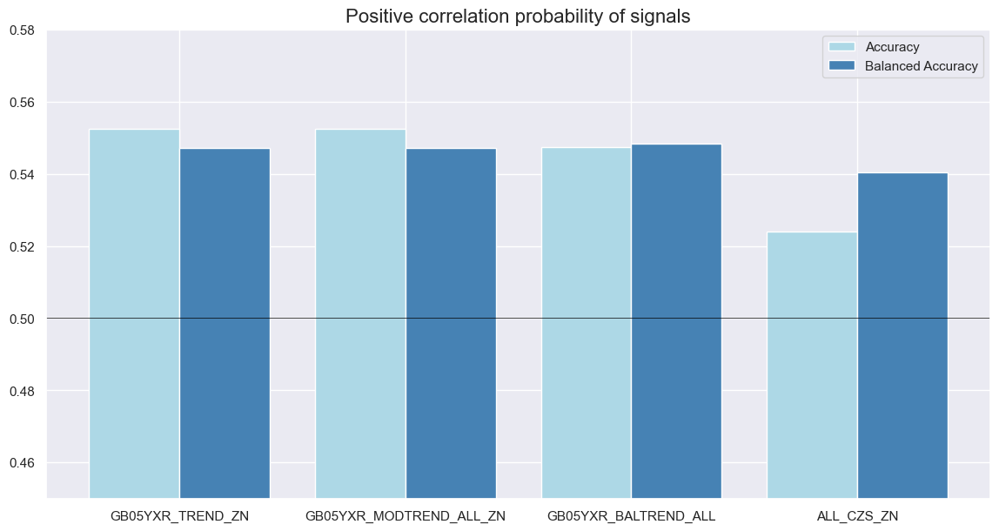

In [ ]:
dix = dict_dir
srr = dix["srr"]

srrx = srr.signals_table().reset_index()
srrx['Signal'] = srrx['Signal'].apply(lambda x: col_mapping.get(x, x))
srrx = srrx.set_index(['Return','Signal','Frequency','Aggregation'])
display(srrx.sort_index().astype("float").round(3))

srr.accuracy_bars(
    type="signals",
    size=(14, 7),
    title="Positive correlation probability of signals",
)

#### Naive PnL

In [81]:
dix = dict_dir

sigx = dix["sigs"]
targ = dix["targs"][0]
cidx = dix["cidx"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    bms=["USD_GB10YXR_NSA"],
)

for sig in sigx:
    for bias in [0, 1]:
        naive_pnl.make_pnl(
            sig,
            sig_neg=False,
            sig_op='zn_score_pan',
            sig_add=bias,
            thresh=3,
            rebal_freq="monthly",
            vol_scale=10,
            rebal_slip=1,
            pnl_name=sig+"_PZN" + str(bias)
        )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = naive_pnl

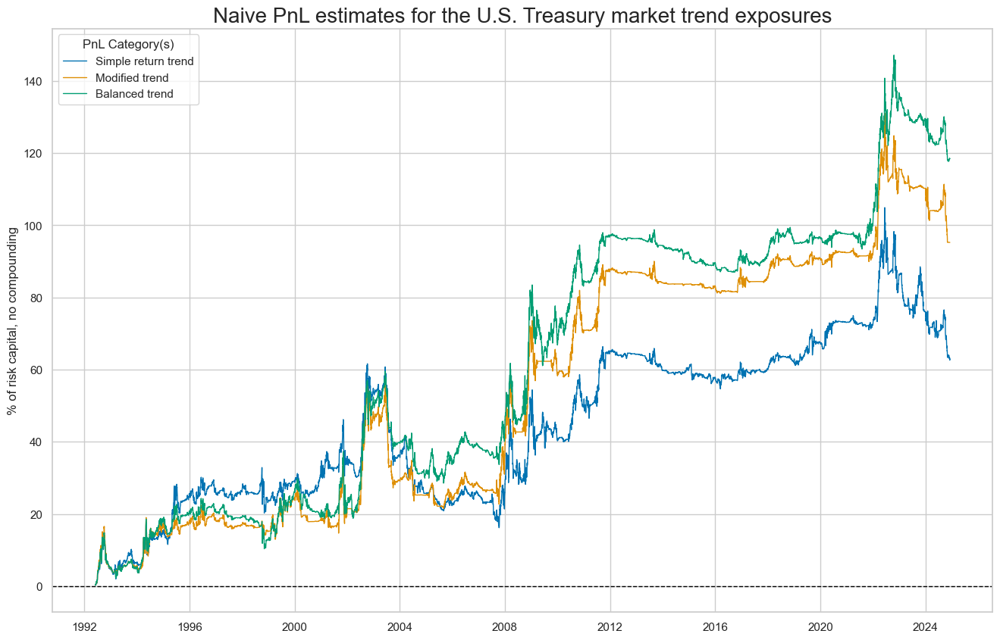

In [116]:
dix = dict_dir

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [sig + "_PZN0" for sig in sigx[:3]] # + ["Long only"]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title='Naive PnL estimates for the U.S. Treasury market trend exposures',
    xcat_labels=['Simple return trend','Modified trend','Balanced trend'],
    figsize=(16, 10),
)

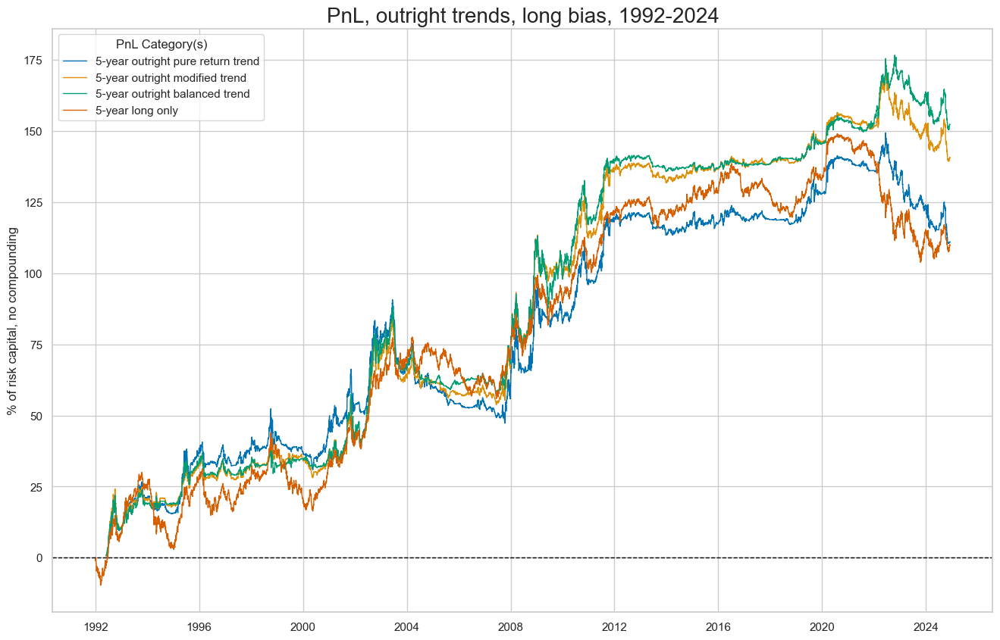

In [83]:
dix = dict_dir

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [sig + "_PZN1" for sig in sigx[:3]]  + ["Long only"]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title='PnL, outright trends, long bias, 1992-2024',
    xcat_labels=['5-year outright pure return trend','5-year outright modified trend','5-year outright balanced trend', '5-year long only'],
    figsize=(16, 10),
)

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_GB10YXR_NSA correl,Traded Months
xcat,,,,,,,,,,
Pure trend,1.93269,10.0,0.193269,0.273418,-14.47169,-24.666536,-45.449062,2.349345,0.173845,396
Long pure trend,3.412059,10.0,0.341206,0.485745,-15.403989,-24.662458,-43.484261,1.431819,0.63065,396
Modified trend,2.930814,10.0,0.293081,0.419563,-16.529002,-26.829469,-35.789243,1.755985,0.159116,396
Long modified trend,4.32908,10.0,0.432908,0.6219,-15.312802,-22.761292,-34.150162,1.193194,0.593598,396
Balanced trend,3.644575,10.0,0.364457,0.527435,-14.983569,-20.564685,-30.940448,1.373788,0.1602,396
Long balanced trend,4.68629,10.0,0.468629,0.670632,-14.453283,-23.917795,-31.306809,1.04208,0.580924,396
Macro trend,3.622873,10.0,0.362287,0.521796,-15.570546,-28.652359,-35.589481,1.33093,0.033457,396
Long macro trend,5.063123,10.0,0.506312,0.72456,-14.93982,-27.314174,-29.118257,0.953295,0.471831,396
Long only,3.340665,10.0,0.334066,0.474767,-10.115653,-22.966953,-45.295476,1.132314,0.919757,396


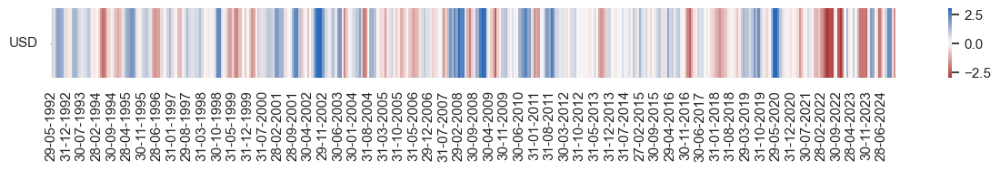

In [84]:
dix = dict_dir

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [s + "_PZN" + str(bias) for s in sigx for bias in [0, 1]] + ["Long only"]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)
column_mapping = {
    'ALL_CZS_ZN_PZN0': 'Macro trend',
    'ALL_CZS_ZN_PZN1': 'Long macro trend',
    'GB05YXR_BALTREND_ALL_PZN0': 'Balanced trend',
    'GB05YXR_BALTREND_ALL_PZN1': 'Long balanced trend',
    'GB05YXR_MODTREND_ALL_ZN_PZN0': 'Modified trend',
    'GB05YXR_MODTREND_ALL_ZN_PZN1': 'Long modified trend',
    'GB05YXR_TREND_ZN_PZN0': 'Pure trend',
    'GB05YXR_TREND_ZN_PZN1': 'Long pure trend',
    'Long only': 'Long only'
}

# Rename the columns
df_eval = df_eval.rename(columns=column_mapping)

display(df_eval.transpose())

naive_pnl.signal_heatmap(
    pnl_name=pnls[0], 
    freq="m",
    title=None,  
    figsize=(15, 1)
)

### Curve trend signals

#### Specs and panel tests

In [85]:
sigs = [
    "GB10v02YXR_TREND_ZN",
    "GB10v02YXR_MODTREND_ALL_ZN",
    "GB10v02YXR_BALTREND_ALL",
    "ALL_CZS_ZN_NEG",
]
targ = ["GB10v2VTXR"]
cidx = cids_gb
start = "1992-01-01"

dict_crv = {
    "sigs": sigs,
    "targs": targ,
    "cidx": cidx,
    "start": start,
    "srr": None,
    "pnls": None,
}

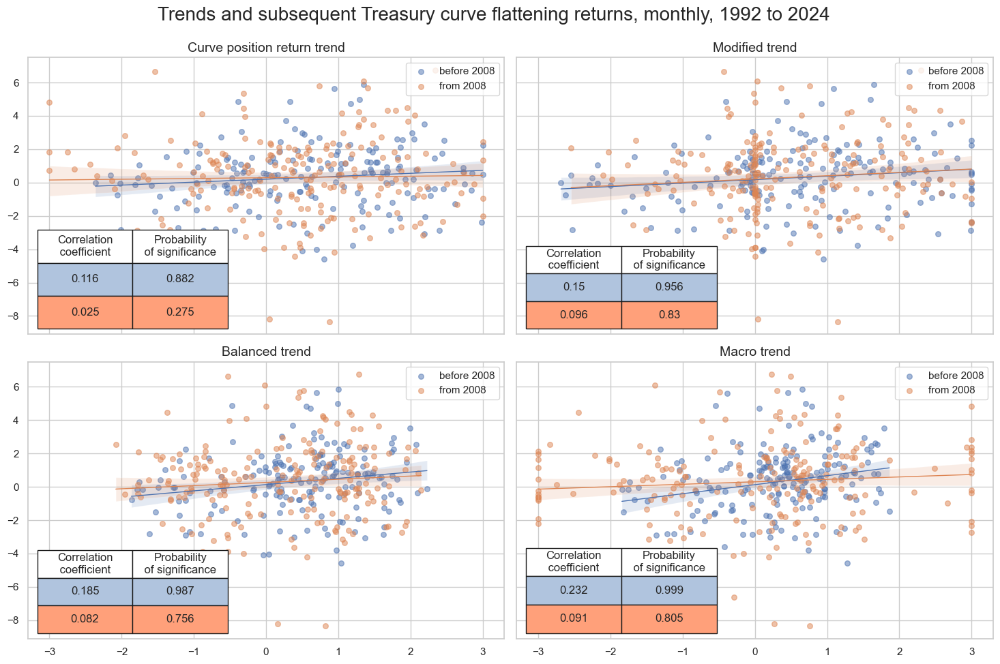

In [119]:
dix = dict_crv

sigs = dix["sigs"]
targ = dix["targs"][0]
cidx = dix["cidx"]
start = dix["start"]

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title="Trends and subsequent Treasury curve flattening returns, monthly, 1992 to 2024",
    ylab=None,
    ncol=2,
    nrow=2,
    separator=2008,
    figsize=(15, 10),
    prob_est="pool",
    coef_box="lower left",
    subplot_titles=[
        "Curve position return trend",
        "Modified trend",
        "Balanced trend",
        "Macro trend",
    ],
)

#### Accuracy and correlation check

In [87]:
dix = dict_crv

sigx = dix["sigs"]
targx = [dix["targs"][0]]
cidx = dix["cidx"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    freqs="M",
    start=start,
)

dix["srr"] = srr

accuracy  bal_accuracy  \
Return     Signal            Frequency Aggregation                           
GB10v2VTXR Balanced trend    M         last            0.579         0.562   
           Macro trend       M         last            0.610         0.598   
           Modified trend    M         last            0.549         0.529   
           Pure return trend M         last            0.549         0.529   

                                                    pos_sigr  pos_retr  \
Return     Signal            Frequency Aggregation                       
GB10v2VTXR Balanced trend    M         last            0.665     0.571   
           Macro trend       M         last            0.641     0.570   
           Modified trend    M         last            0.661     0.573   
           Pure return trend M         last            0.661     0.573   

                                                    pos_prec  neg_prec  \
Return     Signal            Frequency Aggregation                       
GB10v2VTXR Balanced trend    M         last            0.613     0.512   
           Macro trend       M         last            0.640     0.556   
           Modified trend    M         last            0.592     0.466   
           Pure return trend M         last            0.592     0.466   

                                                    pearson  pearson_pval  \
Return     Signal            Frequency Aggregation                          
GB10v2VTXR Balanced trend    M         last           0.120         0.018   
           Macro trend       M         last           0.129         0.010   
           Modified trend    M         last           0.118         0.021   
           Pure return trend M         last           0.061         0.234   

                                                    kendall  kendall_pval  \
Return     Signal            Frequency Aggregation                          
GB10v2VTXR Balanced trend    M         last           0.077         0.024   
           Macro trend       M         last           0.109         0.001   
           Modified trend    M         last           0.069         0.044   
           Pure return trend M         last           0.037         0.278   

                                                      auc  
Return     Signal            Frequency Aggregation         
GB10v2VTXR Balanced trend    M         last         0.557  
           Macro trend       M         last         0.592  
           Modified trend    M         last         0.526  
           Pure return trend M         last         0.526

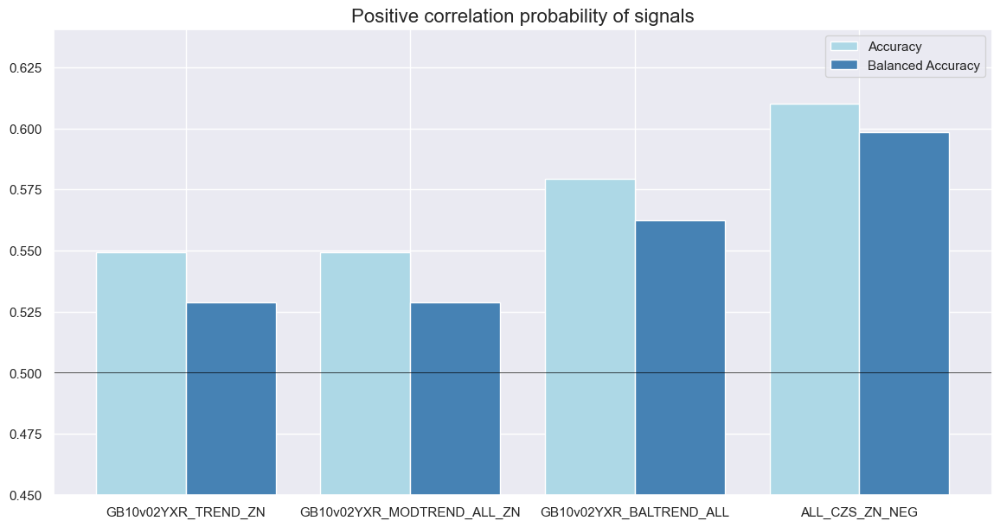

In [ ]:
dix = dict_crv
srr = dix["srr"]

srrx = srr.signals_table().reset_index()
srrx['Signal'] = srrx['Signal'].apply(lambda x: col_mapping.get(x, x))
srrx = srrx.set_index(['Return','Signal','Frequency','Aggregation'])
display(srrx.sort_index().astype("float").round(3))

srr.accuracy_bars(
    type="signals",
    size=(14, 7),
    title="Positive correlation probability of signals",
)

#### Naive PnL

In [89]:
dix = dict_crv

sigx = dix["sigs"]
targ = dix["targs"][0]
cidx = dix["cidx"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    bms=["USD_GB10YXR_NSA"],
)

for sig in sigx:
    for bias in [0, 1]:
        naive_pnl.make_pnl(
            sig,
            sig_neg=False,
            sig_op='zn_score_pan',
            sig_add=bias,
            thresh=3,
            rebal_freq="monthly",
            vol_scale=10,
            rebal_slip=1,
            pnl_name=sig+"_PZN" + str(bias)
        )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = naive_pnl

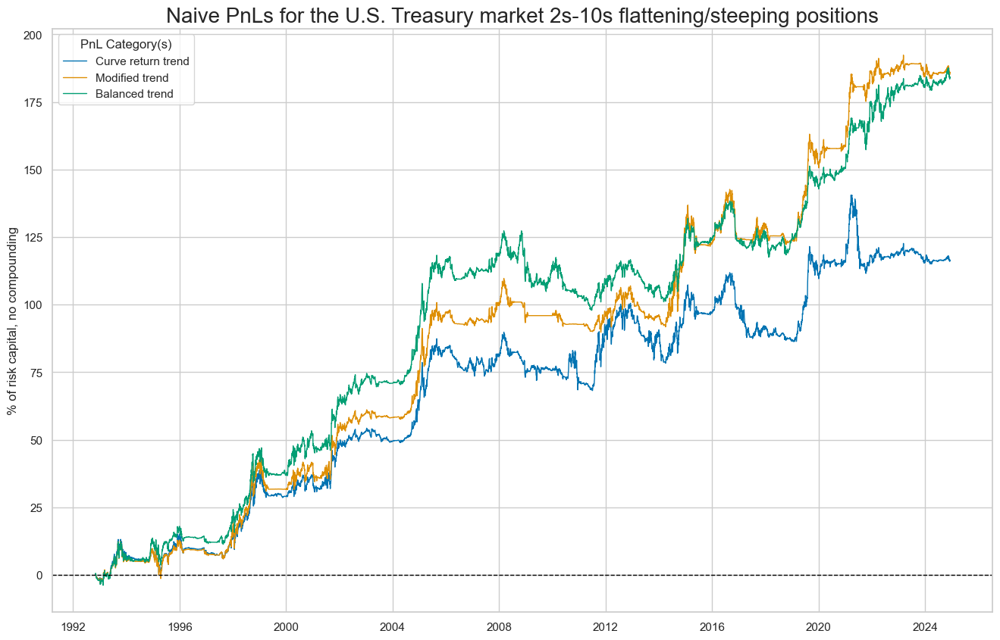

In [120]:
dix = dict_crv

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [sig + "_PZN0" for sig in sigx[:3]] # + ["Long only"]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title='Naive PnLs for the U.S. Treasury market 2s-10s flattening/steeping positions',
    xcat_labels=['Curve return trend','Modified trend', 'Balanced trend'],
    figsize=(16, 10),
)

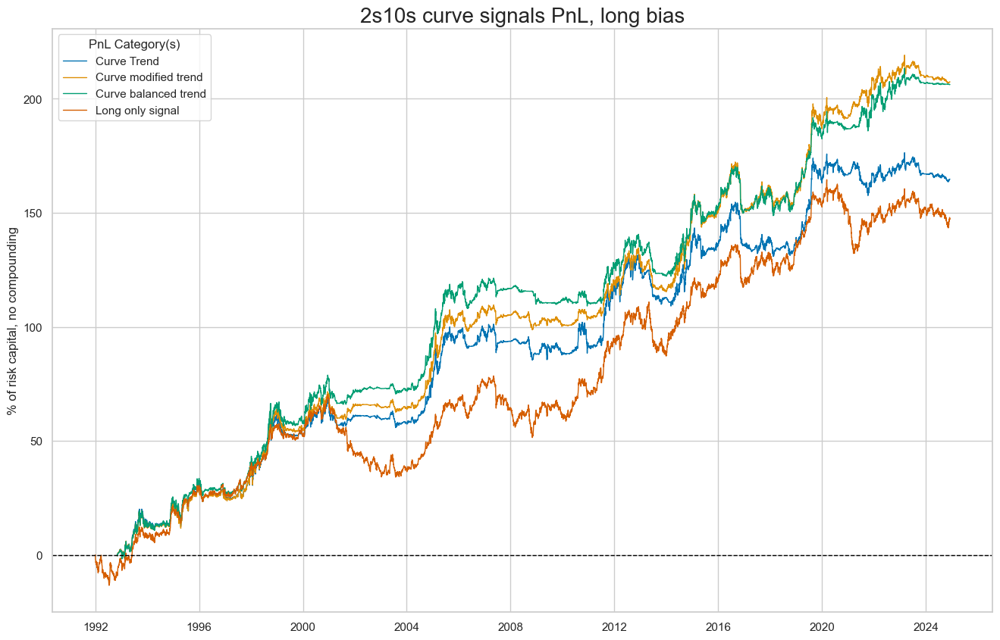

In [91]:
dix = dict_crv

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [sig + "_PZN1" for sig in sigx[:3]] + ["Long only"]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title='2s10s curve signals PnL, long bias',
    xcat_labels=['Curve Trend','Curve modified trend', 'Curve balanced trend', 'Long only signal'],
    figsize=(16, 10),
)

,Return %,St. Dev. %,Sharpe Ratio,Sortino Ratio,Max 21-Day Draw %,Max 6-Month Draw %,Peak to Trough Draw %,Top 5% Monthly PnL Share,USD_GB10YXR_NSA correl,Traded Months
xcat,,,,,,,,,,
Pure trend,3.626716,10.0,0.362672,0.518862,-16.317988,-26.628695,-28.980728,1.355031,0.282438,396
Long pure trend,5.135761,10.0,0.513576,0.736711,-14.055082,-20.133959,-23.744033,0.958309,0.530577,396
Curve modified trend,5.787929,10.0,0.578793,0.841961,-14.067912,-18.367962,-20.411058,0.943389,0.303118,396
Long curve modified trend,6.466872,10.0,0.646687,0.931766,-16.323292,-20.94325,-22.490881,0.761008,0.535111,396
Curve balanced trend,5.734175,10.0,0.573417,0.830782,-14.045807,-20.165742,-29.393009,0.775882,0.24853,396
Long curve balanced trend,6.429757,10.0,0.642976,0.928352,-14.945659,-19.079364,-21.552015,0.703105,0.50875,396
Macro trend,6.062649,10.0,0.606265,0.882667,-14.043297,-29.296527,-42.231735,0.723006,0.124206,396
Long macro trend,7.003965,10.0,0.700397,1.012699,-13.664421,-16.580417,-18.883043,0.630917,0.411549,396
Long only,4.479399,10.0,0.44794,0.630097,-13.64143,-25.70485,-36.261188,0.926593,0.620237,396


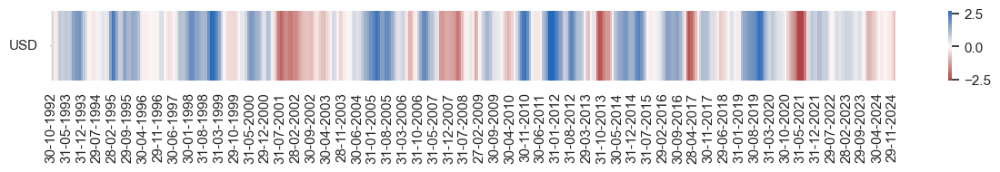

In [92]:
dix = dict_crv

sigx = dix["sigs"]
start = dix["start"]
cidx = dix["cidx"]
naive_pnl = dix["pnls"]

pnls = [s + "_PZN" + str(bias) for s in sigx for bias in [0, 1]] + ["Long only"]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)

column_mapping = {
     'ALL_CZS_ZN_NEG_PZN0': 'Macro trend', 
     'ALL_CZS_ZN_NEG_PZN1': 'Long macro trend',
     'GB10v02YXR_BALTREND_ALL_PZN0': 'Curve balanced trend',
     'GB10v02YXR_BALTREND_ALL_PZN1': 'Long curve balanced trend',
     'GB10v02YXR_MODTREND_ALL_ZN_PZN0': 'Curve modified trend',
     'GB10v02YXR_MODTREND_ALL_ZN_PZN1': 'Long curve modified trend',
     'GB10v02YXR_TREND_ZN_PZN0': 'Pure trend', 
     'GB10v02YXR_TREND_ZN_PZN1': 'Long pure trend'
}

# Rename the columns
df_eval = df_eval.rename(columns=column_mapping)

display(df_eval.transpose())

naive_pnl.signal_heatmap(
    pnl_name=pnls[0], 
    freq="m",
    title=None,  
    figsize=(15, 1)
)

## Annex: Pure economic directional signals

### Specs and panel tests

In [93]:
sigs = [key + "_ZN" for key in dict_all.keys()] + ["ALL_CZS_ZN",]
labs= [val[1] for val in dict_all.values()]
targ = ["GB05YXR_NSA"]
cidx = cids_gb
start = "1992-01-01"

dict_ecodir = {
    "sigs": sigs,
    "targs": targ,
    "cidx": cidx,
    "labs": labs,
    "start": start,
    "srr": None,
    "pnls": None,
    "labs": labs
}

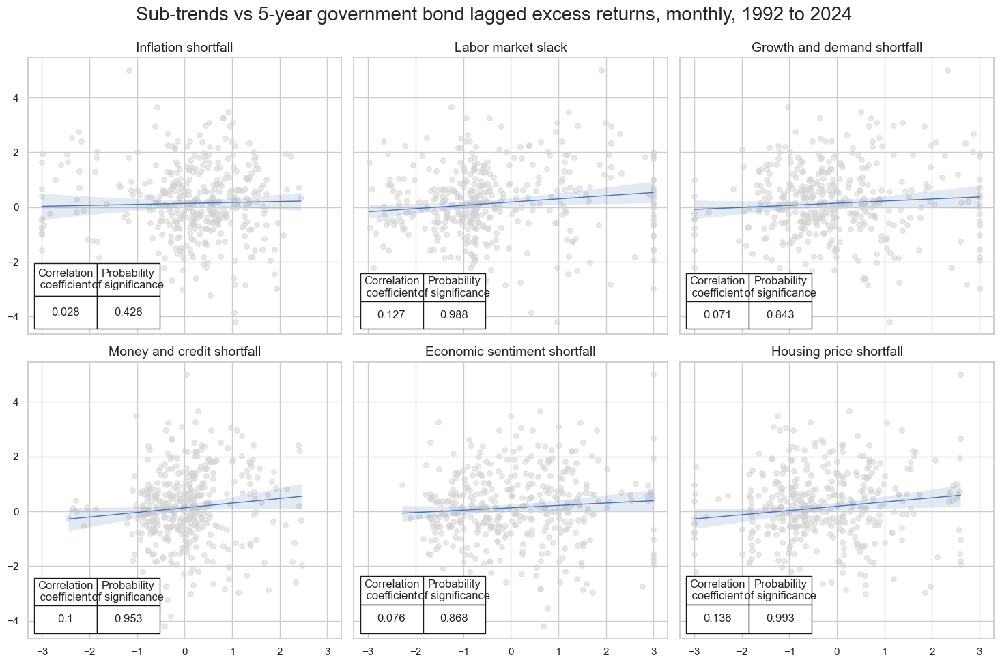

In [94]:
dix = dict_ecodir

sigs = dix["sigs"][:-1]
targ = dix["targs"][0] 
cidx = dix["cidx"]
start = dix["start"]

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title='Sub-trends vs 5-year government bond lagged excess returns, monthly, 1992 to 2024',
    ylab=None,
    ncol=3,
    nrow=2,
    # separator = 2008,
    figsize=(15, 10),
    prob_est="pool",
    coef_box="lower left",
    subplot_titles=labs
)

### Accuracy and correlation check

In [95]:
dix = dict_ecodir

sigx = dix["sigs"]
targx = [dix["targs"][0]]
cidx = dix["cidx"]
start = dix["start"]
labs = dix['labs'] + ['Macro']

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    freqs="M",
    start=start,
)

dix["srr"] = srr

In [96]:
dix = dict_ecodir
srr = dix["srr"]

col_mapping = {
    'INFSHORT_ZN': "Inflation shortfall", 
    'LABSLACK_ZN': "Labor market slack", 
    'GRDSHORT_ZN': "Growth and demand shortfall", 
    'MCRSHORT_ZN': "Money and credit shortfall",
    'SENTSHORT_ZN': "Economic sentiment shortfall", 
    'HPISHORT_ZN': "Housing price shortfall", 
    'ALL_CZS_ZN': "Macro"
}
srrx = srr.signals_table().reset_index()
srrx['Signal'] = srrx['Signal'].apply(lambda x: col_mapping.get(x, x))
srrx = srrx.set_index(['Return','Signal','Frequency','Aggregation'])
display(srrx.sort_index().astype("float").round(3))


accuracy  \
Return      Signal                       Frequency Aggregation             
GB05YXR_NSA Economic sentiment shortfall M         last            0.559   
            Growth and demand shortfall  M         last            0.532   
            Housing price shortfall      M         last            0.519   
            Inflation shortfall          M         last            0.506   
            Labor market slack           M         last            0.539   
            Macro                        M         last            0.524   
            Money and credit shortfall   M         last            0.544   

                                                                bal_accuracy  \
Return      Signal                       Frequency Aggregation                 
GB05YXR_NSA Economic sentiment shortfall M         last                0.559   
            Growth and demand shortfall  M         last                0.544   
            Housing price shortfall      M         last                0.531   
            Inflation shortfall          M         last                0.497   
            Labor market slack           M         last                0.572   
            Macro                        M         last                0.540   
            Money and credit shortfall   M         last                0.544   

                                                                pos_sigr  \
Return      Signal                       Frequency Aggregation             
GB05YXR_NSA Economic sentiment shortfall M         last            0.501   
            Growth and demand shortfall  M         last            0.387   
            Housing price shortfall      M         last            0.390   
            Inflation shortfall          M         last            0.600   
            Labor market slack           M         last            0.289   
            Macro                        M         last            0.359   
            Money and credit shortfall   M         last            0.501   

                                                                pos_retr  \
Return      Signal                       Frequency Aggregation             
GB05YXR_NSA Economic sentiment shortfall M         last            0.547   
            Growth and demand shortfall  M         last            0.547   
            Housing price shortfall      M         last            0.547   
            Inflation shortfall          M         last            0.547   
            Labor market slack           M         last            0.547   
            Macro                        M         last            0.547   
            Money and credit shortfall   M         last            0.547   

                                                                pos_prec  \
Return      Signal                       Frequency Aggregation             
GB05YXR_NSA Economic sentiment shortfall M         last            0.606   
            Growth and demand shortfall  M         last            0.601   
            Housing price shortfall      M         last            0.584   
            Inflation shortfall          M         last            0.544   
            Labor market slack           M         last            0.649   
            Macro                        M         last            0.599   
            Money and credit shortfall   M         last            0.591   

                                                                neg_prec  \
Return      Signal                       Frequency Aggregation             
GB05YXR_NSA Economic sentiment shortfall M         last            0.513   
            Growth and demand shortfall  M         last            0.488   
            Housing price shortfall      M         last            0.477   
            Inflation shortfall          M         last            0.449   
            Labor market slack           M         last            0.495   
            Macro                        M         last            0.48

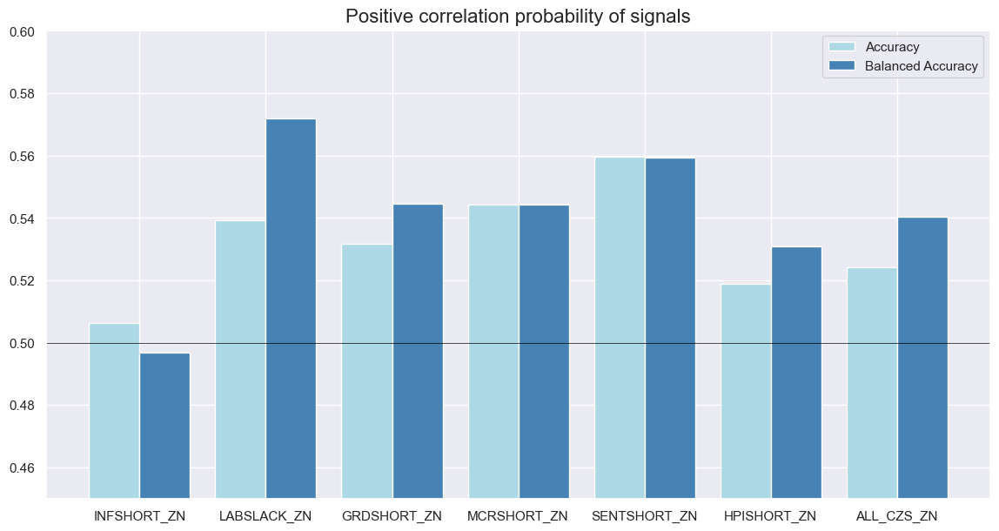

In [97]:
srr.accuracy_bars(
    type="signals",
    size=(14, 7),
    title="Positive correlation probability of signals",
)

## Annex: Pure economic curve signals

### Specs and panel tests

In [98]:
sigs= [key + "_ZN_NEG" for key in dict_all.keys()] + ["ALL_CZS_ZN_NEG",]

targ = ["GB10v2VTXR"]
cidx = cids_gb
start = "1992-01-01"
labs= [val[1] for val in dict_all.values()]

dict_ecocrv = {
    "sigs": sigs,
    "targs": targ,
    "cidx": cidx,
    "start": start,
    "srr": None,
    "pnls": None,
    "labs": labs
}

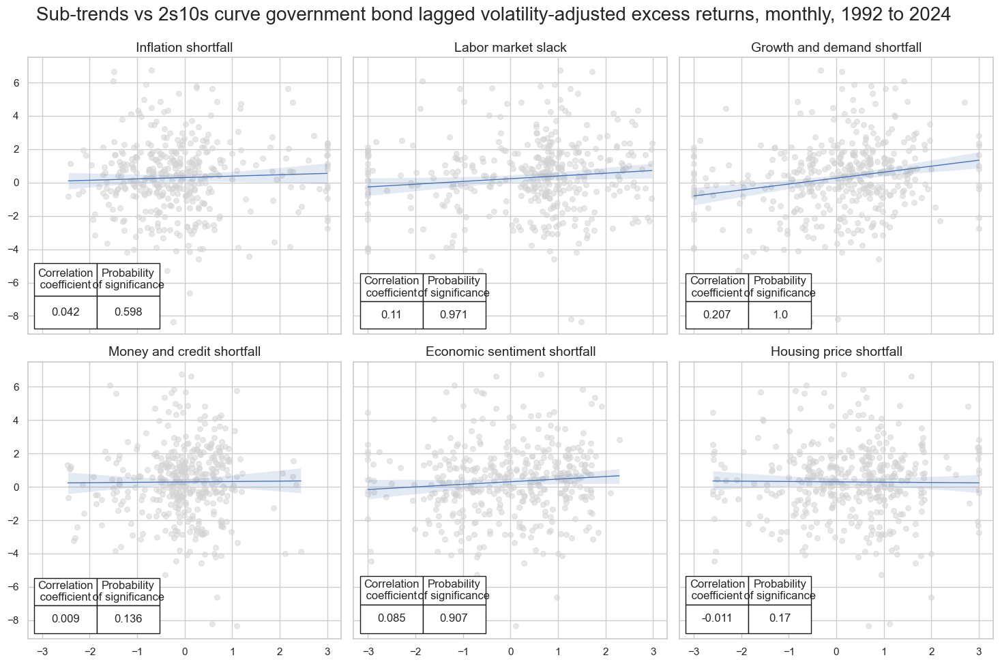

In [99]:
dix = dict_ecocrv

sigs = dix["sigs"][:-1]
targ = dix["targs"][0] 
cidx = dix["cidx"]
start = dix["start"]
labs = dix['labs']

# Initialize the dictionary to store CategoryRelations instances

dict_cr = {}

for sig in sigs:
    dict_cr[sig] = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
    )

# Plotting the results

crs = list(dict_cr.values())
crs_keys = list(dict_cr.keys())

msv.multiple_reg_scatter(
    cat_rels=crs,
    title='Sub-trends vs 2s10s curve government bond lagged volatility-adjusted excess returns, monthly, 1992 to 2024',
    ylab=None,
    ncol=3,
    nrow=2,
    # separator = 2008,
    figsize=(15, 10),
    prob_est="pool",
    coef_box="lower left",
    subplot_titles=labs
)

### Accuracy and correlation check

In [100]:
dix = dict_ecocrv

sigx = dix["sigs"]
targx = [dix["targs"][0]]
cidx = dix["cidx"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigx,
    rets=targx,
    freqs="M",
    start=start,
)

dix["srr"] = srr

accuracy  bal_accuracy  \
Return     Signal           Frequency Aggregation                           
GB10v2VTXR ALL_CZS_ZN_NEG   M         last            0.610         0.598   
           GRDSHORT_ZN_NEG  M         last            0.592         0.581   
           HPISHORT_ZN_NEG  M         last            0.514         0.499   
           INFSHORT_ZN_NEG  M         last            0.491         0.505   
           LABSLACK_ZN_NEG  M         last            0.559         0.537   
           MCRSHORT_ZN_NEG  M         last            0.509         0.509   
           SENTSHORT_ZN_NEG M         last            0.539         0.539   

                                                   pos_sigr  pos_retr  \
Return     Signal           Frequency Aggregation                       
GB10v2VTXR ALL_CZS_ZN_NEG   M         last            0.641      0.57   
           GRDSHORT_ZN_NEG  M         last            0.613      0.57   
           HPISHORT_ZN_NEG  M         last            0.610      0.57   
           INFSHORT_ZN_NEG  M         last            0.400      0.57   
           LABSLACK_ZN_NEG  M         last            0.711      0.57   
           MCRSHORT_ZN_NEG  M         last            0.499      0.57   
           SENTSHORT_ZN_NEG M         last            0.499      0.57   

                                                   pos_prec  neg_prec  \
Return     Signal           Frequency Aggregation                       
GB10v2VTXR ALL_CZS_ZN_NEG   M         last            0.640     0.556   
           GRDSHORT_ZN_NEG  M         last            0.632     0.529   
           HPISHORT_ZN_NEG  M         last            0.568     0.429   
           INFSHORT_ZN_NEG  M         last            0.576     0.435   
           LABSLACK_ZN_NEG  M         last            0.591     0.482   
           MCRSHORT_ZN_NEG  M         last            0.579     0.439   
           SENTSHORT_ZN_NEG M         last            0.609     0.470   

                                                   pearson  pearson_pval  \
Return     Signal           Frequency Aggregation                          
GB10v2VTXR ALL_CZS_ZN_NEG   M         last           0.129         0.010   
           GRDSHORT_ZN_NEG  M         last           0.207         0.000   
           HPISHORT_ZN_NEG  M         last          -0.011         0.830   
           INFSHORT_ZN_NEG  M         last           0.042         0.402   
           LABSLACK_ZN_NEG  M         last           0.110         0.029   
           MCRSHORT_ZN_NEG  M         last           0.009         0.864   
           SENTSHORT_ZN_NEG M         last           0.085         0.093   

                                                   kendall  kendall_pval  \
Return     Signal           Frequency Aggregation                          
GB10v2VTXR ALL_CZS_ZN_NEG   M         last           0.109         0.001   
           GRDSHORT_ZN_NEG  M         last           0.140         0.000   
           HPISHORT_ZN_NEG  M         last           0.006         0.847   
           INFSHORT_ZN_NEG  M         last           0.036         0.283   
           LABSLACK_ZN_NEG  M         last           0.068         0.043   
           MCRSHORT_ZN_NEG  M         last           0.034         0.319   
           SENTSHORT_ZN_NEG M         last           0.071         0.035   

                                                     auc  
Return     Signal           Frequency Aggregation         
GB10v2VTXR ALL_CZS_ZN_NEG   M         last         0.592  
           GRDSHORT_ZN_NEG  M         last         0.578  
           HPISHORT_ZN_NEG  M         last         0.499  
           INFSHORT_ZN_NEG  M         last         0.505  
           LABSLACK_ZN_NEG  M         last         0.531  
           MCRSHORT_ZN_NEG  M         last         0.509  
           SENTSHORT_ZN_NEG M         last         0.540

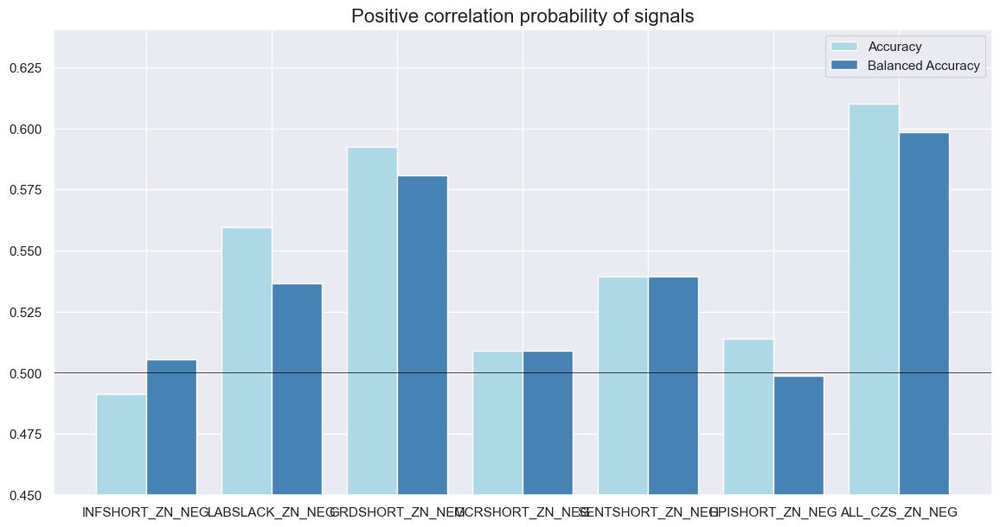

In [101]:
dix = dict_ecocrv
srr = dix["srr"]
display(srr.signals_table().sort_index().astype("float").round(3))

srr.accuracy_bars(
    type="signals",
    size=(14, 7),
    title="Positive correlation probability of signals",
)

accuracy  bal_accuracy  \
Return      Signal            Frequency Aggregation                           
GB05YXR_NSA Balanced trend    M         last            0.547         0.548   
            Macro trend       M         last            0.524         0.540   
            Modified trend    M         last            0.552         0.547   
            Pure return trend M         last            0.552         0.547   

                                                     pos_sigr  pos_retr  \
Return      Signal            Frequency Aggregation                       
GB05YXR_NSA Balanced trend    M         last            0.488     0.547   
            Macro trend       M         last            0.359     0.547   
            Modified trend    M         last            0.565     0.547   
            Pure return trend M         last            0.565     0.547   

                                                     pos_prec  neg_prec  \
Return      Signal            Frequency Aggregation                       
GB05YXR_NSA Balanced trend    M         last            0.597     0.500   
            Macro trend       M         last            0.599     0.482   
            Modified trend    M         last            0.588     0.506   
            Pure return trend M         last            0.588     0.506   

                                                     pearson  pearson_pval  \
Return      Signal            Frequency Aggregation                          
GB05YXR_NSA Balanced trend    M         last           0.122         0.016   
            Macro trend       M         last           0.135         0.007   
            Modified trend    M         last           0.096         0.058   
            Pure return trend M         last           0.056         0.267   

                                                     kendall  kendall_pval  \
Return      Signal            Frequency Aggregation                          
GB05YXR_NSA Balanced trend    M         last           0.099         0.003   
            Macro trend       M         last           0.097         0.004   
            Modified trend    M         last           0.084         0.013   
            Pure return trend M         last           0.054         0.109   

                                                       auc  
Return      Signal            Frequency Aggregation         
GB05YXR_NSA Balanced trend    M         last         0.549  
            Macro trend       M         last         0.538  
            Modified trend    M         last         0.547  
            Pure return trend M         last         0.547

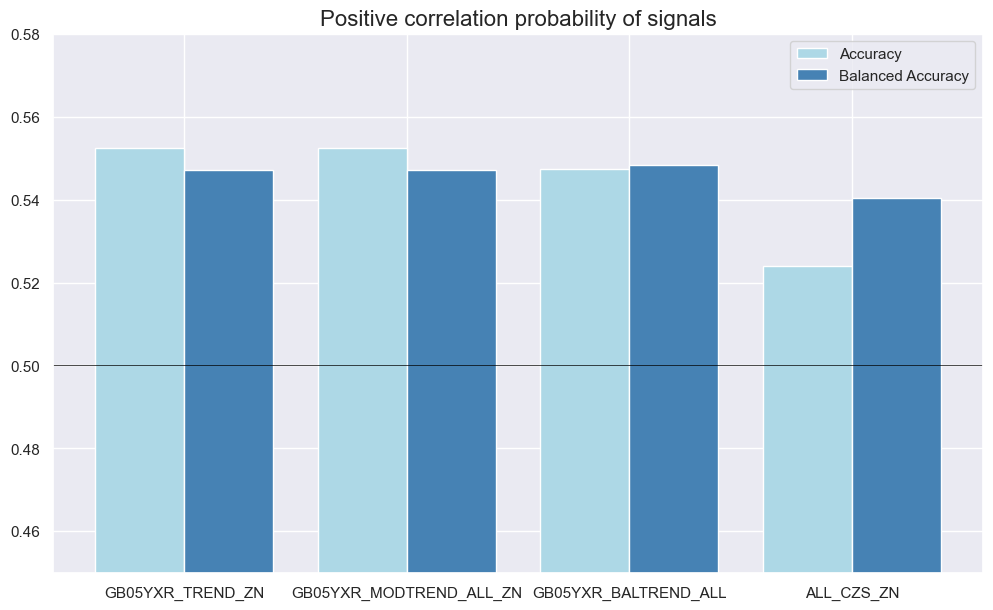

In [102]:
dix = dict_dir
srr = dix["srr"]
col_mapping = {
    'ALL_CZS_ZN': "Macro trend", 
    'GB05YXR_BALTREND_ALL': "Balanced trend", 
    'GB05YXR_MODTREND_ALL_ZN': "Modified trend", 
    'GB05YXR_TREND_ZN': "Pure return trend",
}
srrx = srr.signals_table().reset_index()
srrx['Signal'] = srrx['Signal'].apply(lambda x: col_mapping.get(x, x))
srrx = srrx.set_index(['Return','Signal','Frequency','Aggregation'])
display(srrx.sort_index().astype("float").round(3))

srr.accuracy_bars(
    type="signals",
    size=(12, 7),
    title="Positive correlation probability of signals",
)